In [1]:
#Environment Setup; 
import sys, os
project_path = os.path.abspath("/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT")
sys.path.append(project_path)
print("Env setup complete. Contents of root dir:", os.listdir(project_path))
      
#ensure editting of parent paper class files[mmst_vit classes, etc.] 
#are being reloaded/updated automatically in background.
%reload_ext autoreload
%autoreload 2
      

Env setup complete. Contents of root dir: ['models_pvt_simclr.py', 'main_pretrain_mmst_vit.py', 'attention.py', 'models_mmst_vit.py', '.DS_Store', 'requirements.txt', 'util', 'loss', 'config', 'input', 'dataset', 'main_finetune_mmst_vit.py', '__pycache__', 'soybean_predictions.csv', 'TinyCropNet', 'output_dir', '.ipynb_checkpoints', 'TinyCropNet_Setup_Jupyter.txt', 'models_pvt.py', 'data']


In [2]:
#installing proj dependences, packages, downloaded sentinel data, and hugging face tinycropnet data
#!pip install -r /Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/requirements.txt
#!pip install datasets
#!pip install zscore

#import libs and verify versions of installed/required packages 
#verifying previous versions of packages are the same of when the baseline was implemeneted [2years old].


import torch
import timm
import einops
from PIL import Image
import sklearn
import tensorboard
import tqdm
from tqdm import tqdm 
import torchvision
#from tqdm import tqdm #progress package for tracking iterations/epochs.
import numpy as np
from scipy.stats import zscore
import matplotlib.pyplot as plt 
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd #for manip and handling data
import h5py
import json
import seaborn as sns
import glob
#importing timm modules 
#layers for building blocks [like attention, conv neural net].
#and models for pvtsimclr's vision and architectures.
from  timm import layers
from timm import models

from datasets import load_dataset #hugging face data
from torch.utils.data import DataLoader

#adding relevant mmst model and dtset loader scripts to path
from models_mmst_vit import MMST_ViT
from models_pvt_simclr import PVTSimCLR
from dataset.sentinel_loader import Sentinel_Dataset
from dataset.usda_loader import USDA_Dataset
from dataset.hrrr_loader import HRRR_Dataset
#lin, reg, model packages
from pandas.plotting import parallel_coordinates
from sklearn.ensemble import RandomForestRegressor #simple
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.metrics import mean_squared_error, r2_score

print("Successful import")



/Users/aubayazzarouk/miniconda3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/aubayazzarouk/miniconda3/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/Users/aubayazzarouk/miniconda3/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)


Successful import


In [3]:
#Loading in Multi-Model TinyCropNet WRF-HRRR and USDA_soybeans data:
'''
def load_usda_dataset(path):
    from dataset.usda_loader import USDA_Dataset
    return USDA_Dataset(path=path)

def load_hrrr_dataset(path):
    from dataset.hrrr_loader import HRRR_Dataset
    return HRRR_Dataset(path=path)


#Loading in our own enhanced sentinel_2 imagery dataloader 
def load_sentinel_dataset(root_path, year, transform=None):
    from dataset.sentinel_loader import Sentinel_Dataset
    return Sentinel_Dataset(root=root_path, year=year, transform=transform)

#MMST:Model(s) loader functions:
def load_mmst_vit_model(config_path):
    from models_mmst_vit import MMST_ViT
    return MMST_VIT()
    
def load_pvtsim(checkpoint_path = None):
    from models_pvt_simclr import PVTSimCLR
    model = PVTSimCLR()

    #look for pretrained mmst_vit checkpoint(s) #from google colab A100 Tpu run
    if checkpoint_path:
        model.load_state_dict((torch.load(checkpoint_path)))
    return model

#Maybe?
def run_inference(model, dataloader, device='cpu'):
    model.eval()
    preds = []
    with torch.no_grad():
        for batch in dataloader:
            out = model(batch)
            preds.append(out)
    return preds

#Evaluations:
def evaluate_predictions(prediction,target):
    #import
    from sklearn.metrics import mean_squared_error, r2_score
    
    mse = mean_squared_error(target, prediction)
    r2 = r2_score(targets,pred)
    print(f"MSE: {mse:.2f}, R^2 {r2:.2f}")

    return mse,r2
'''
    

'\ndef load_usda_dataset(path):\n    from dataset.usda_loader import USDA_Dataset\n    return USDA_Dataset(path=path)\n\ndef load_hrrr_dataset(path):\n    from dataset.hrrr_loader import HRRR_Dataset\n    return HRRR_Dataset(path=path)\n\n\n#Loading in our own enhanced sentinel_2 imagery dataloader \ndef load_sentinel_dataset(root_path, year, transform=None):\n    from dataset.sentinel_loader import Sentinel_Dataset\n    return Sentinel_Dataset(root=root_path, year=year, transform=transform)\n\n#MMST:Model(s) loader functions:\ndef load_mmst_vit_model(config_path):\n    from models_mmst_vit import MMST_ViT\n    return MMST_VIT()\n    \ndef load_pvtsim(checkpoint_path = None):\n    from models_pvt_simclr import PVTSimCLR\n    model = PVTSimCLR()\n\n    #look for pretrained mmst_vit checkpoint(s) #from google colab A100 Tpu run\n    if checkpoint_path:\n        model.load_state_dict((torch.load(checkpoint_path)))\n    return model\n\n#Maybe?\ndef run_inference(model, dataloader, device=\

In [4]:
val_json_path_old = os.path.join(project_path, "data/soybean_val.json") #[Lucas, Monroe] -> soybean_val.json
#loading in JSON contents
with open(val_json_path_old) as f:
    val_json_old = json.load(f)
all_fips = {rec["FIPS"] for rec in val_json_old} #iterate through all counties/entries
print("Counties in soybean_val.json:", all_fips)


print(json.dumps(val_json_old[0], indent=2)) #printing a single record with all keys and multimodal metadata

#output: 
#FIPS -> 19917,19135
#FIRST record: FIPS, year, County, State, County_ansi, State_ansi, data
#19917, 2022, Lucas, IA, 117, 19, 
#[HRRR -> [short, longterm] [ each csv has both monthly and daily rows.]
# short term -> list of 2022 april to septemeber monthly data [most recenthrr data]
# long term -> list of year by year wrf data [all months from 2017-2021].

#USDA ->[USDA_SOYBEAN_COUNTY_2022.CSV],
#contains csv path that holds lucas county soybean yields and production for 2022.

#sentinel imagery [agri_19_ia_2022 [04-07 and 07-09] -> only contains relvant hdf5 files (srping/summer)

Counties in soybean_val.json: {'19135', '19117'}
{
  "FIPS": "19117",
  "year": 2022,
  "county": "LUCAS",
  "state": "IA",
  "county_ansi": "117",
  "state_ansi": "19",
  "data": {
    "HRRR": {
      "short_term": [
        "WRF-HRRR/data/2022/IA/HRRR_19_IA_2022-04.csv",
        "WRF-HRRR/data/2022/IA/HRRR_19_IA_2022-05.csv",
        "WRF-HRRR/data/2022/IA/HRRR_19_IA_2022-06.csv",
        "WRF-HRRR/data/2022/IA/HRRR_19_IA_2022-07.csv",
        "WRF-HRRR/data/2022/IA/HRRR_19_IA_2022-08.csv",
        "WRF-HRRR/data/2022/IA/HRRR_19_IA_2022-09.csv"
      ],
      "long_term": [
        [
          "WRF-HRRR/data/2017/IA/HRRR_19_IA_2017-01.csv",
          "WRF-HRRR/data/2017/IA/HRRR_19_IA_2017-02.csv",
          "WRF-HRRR/data/2017/IA/HRRR_19_IA_2017-03.csv",
          "WRF-HRRR/data/2017/IA/HRRR_19_IA_2017-04.csv",
          "WRF-HRRR/data/2017/IA/HRRR_19_IA_2017-05.csv",
          "WRF-HRRR/data/2017/IA/HRRR_19_IA_2017-06.csv",
          "WRF-HRRR/data/2017/IA/HRRR_19_IA_2017-07.csv",
 

In [7]:
#succesffuly ran evaluation script on enhanced main-fine tune script
# model succesffully loaded from checkpoint 198 -> 200th epoch. 
#evaluated on validation set /soybean_val.json
#managed to run it on cpu mode 
#saved metrics / predictions to output_dir.

#Model performance on validation set: RMSE 2.78
#R^2 Squared : 1.00
#Correlation (pearson) : 1.00
#baseline mmst-vit pretrain and finetune implementation on pre saved checkpoints 
#code:
checkpoint_path = os.path.join(project_path, "output_dir/mmst_vit/checkpoint-198.pth")
pvt_path = os.path.join(project_path, "output_dir/pvt_simclr/checkpoint-199.pth")
checkpoint = torch.load(checkpoint_path, map_location=torch.device("cpu"),weights_only=False)
pvt_checkpoint = torch.load(pvt_path, map_location=torch.device("cpu"),weights_only=False)
pvt = PVTSimCLR(base_model='pvt_tiny', out_dim=512, context_dim=9)
pvt.load_state_dict(pvt_checkpoint['model'])
pvt.eval()

import subprocess
#baseline finetune
project_root = "/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT"
script_path = os.path.join(project_root, "main_finetune_mmst_vit.py")
data_file_train = os.path.join(project_root, "data/soybean_train.json")
data_file_val = os.path.join(project_root, "data/soybean_val.json")
root_dir = os.path.join(project_root, "TinyCropNet")
checkpoint_path = os.path.join(project_root, "output_dir/mmst_vit/checkpoint-198.pth")
sys.path.append(project_root)
command = [
    "python", script_path,
    "--data_file_train", data_file_train,
    "--data_file_val", data_file_val,
    "--root_dir", root_dir,
    "--device", "cpu",
    "--eval",
    "--resume", checkpoint_path,
    "--num_workers", "0"  
]
subprocess.run(command)

/Users/aubayazzarouk/miniconda3/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/Users/aubayazzarouk/miniconda3/lib/python3.12/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/util/misc.py:255: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self._scaler = torch.cuda.amp.GradScaler()
/Users/aubayazzarouk/miniconda3/lib/python3.12/site-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is no

Not using distributed mode
[18:16:17.203325] job dir: /Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT
[18:16:17.203371] Namespace(batch_size=64,
embed_dim=512,
epochs=200,
model_pvt='pvt_tiny',
accum_iter=1,
input_size=224,
norm_pix_loss=False,
weight_decay=0.05,
lr=None,
blr=0.001,
min_lr=0.0,
warmup_epochs=40,
output_dir='./output_dir/mmst_vit',
log_dir='./output_dir/mmst_vit',
device='cpu',
seed=0,
start_epoch=0,
num_workers=0,
pin_mem=True,
world_size=1,
local_rank=-1,
dist_on_itp=False,
dist_url='env://',
root_dir='/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/TinyCropNet',
save_freq=2,
data_file_train='/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/data/soybean_train.json',
data_file_val='/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/data/soybean_val.json',
pvt_simclr='',
eval=True,
eval_year=2022,
resume='/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/output_dir/mmst_vit/che

CompletedProcess(args=['python', '/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/main_finetune_mmst_vit.py', '--data_file_train', '/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/data/soybean_train.json', '--data_file_val', '/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/data/soybean_val.json', '--root_dir', '/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/TinyCropNet', '--device', 'cpu', '--eval', '--resume', '/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/output_dir/mmst_vit/checkpoint-198.pth', '--num_workers', '0'], returncode=0)

In [8]:
#inspecting soybean data from 2017 -> 2022 for time series and panel-based insights:
print(project_path) #/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT

#historical usda soybean path for all yearly yields: 
usda_root = os.path.join(project_path, "TinyCropNet/USDA Crop Dataset/data/Soybean")
#verifying contents of yearly usda data:
usda_dfs = []
for year_folder in sorted(os.listdir(usda_root)):
    year_path = os.path.join(usda_root, year_folder)
    
    if os.path.isdir(year_path):
        for file in os.listdir(year_path):
            if file.endswith(".csv"):
                csv_path = os.path.join(year_path, file)
                #print("Loading:", csv_path)
                df = pd.read_csv(csv_path)
                df["year"] = int(year_folder)  # add year column for tracking
                usda_dfs.append(df)
#combine all years in df
usda_all = pd.concat(usda_dfs, ignore_index=True)

#subset of usda file to filter on iowa through state_ansi keys to look at our target state from all years:
usda_iowa = usda_all[usda_all["state_ansi"] == 19]

#Get counties that exist on all training years (2019, 2020 and 2021 have some missing counties that weren't recorded)
#using 2017 and 2018 as the clean base to create feature alignment on 19,20, and 21:
#important to do at least get all counties that appear to avoid mismatches later on in mmst-vit: 

#training window: 
training_years = [2017,2018,2019,2020,2021]

train_only = usda_iowa[usda_iowa["year"].isin(training_years)]
print("\nTraining Year count per IA_county:")

#counting the counties that appear by year in the training window:
consistent_counties = (
    train_only.groupby("county_ansi")["year"]
    .nunique()
    .reset_index()
)
#Optional: print the actual county ANSI codes
#keep counties that appear in all 5 years: (51 counties)
consistent_counties = consistent_counties[consistent_counties["year"] == len(training_years)]["county_ansi"]
print("\nConsistent county_ansi codes:\n", sorted(consistent_counties.tolist()))
# Subset USDA Iowa data again to just those consistent counties
usda_train_consistent = train_only[train_only["county_ansi"].isin(consistent_counties)]

#Quick peek of usda data with training years with full context:
print("\n",usda_train_consistent.tail(2))

#Ref. filtered, clean dataset on usda iowa counties with matching counties:
usda_iowa_consistent = usda_iowa[
    (usda_iowa["year"].isin(training_years)) &
    (usda_iowa["county_ansi"].isin(consistent_counties))
]
print("\n")
print("\nQuick Peek of cleaned usda iowa data:")
print(usda_iowa_consistent.head(2))


/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT

Training Year count per IA_county:

Consistent county_ansi codes:
 [9, 11, 13, 15, 19, 23, 25, 27, 29, 33, 41, 45, 47, 49, 51, 59, 65, 69, 73, 75, 79, 81, 83, 87, 89, 91, 101, 105, 109, 111, 119, 121, 131, 133, 135, 137, 139, 141, 145, 153, 163, 169, 171, 175, 177, 179, 187, 189, 191, 195, 197]

      commodity_desc reference_period_desc  year  state_ansi state_name  \
5400       SOYBEANS                  YEAR  2021          19       IOWA   
5401       SOYBEANS                  YEAR  2021          19       IOWA   

      county_ansi county_name  asd_code       asd_desc domain_desc  \
5400          195       WORTH        20  NORTH CENTRAL       TOTAL   
5401          197      WRIGHT        20  NORTH CENTRAL       TOTAL   

     source_desc agg_level_desc  PRODUCTION, MEASURED IN BU  \
5400      SURVEY         COUNTY                   5316000.0   
5401      SURVEY         COUNTY                   8274000.0   

      YIE


Printing description of yield/production stats for all counties across iowa (2017-2021):
       YIELD, MEASURED IN BU / ACRE  PRODUCTION, MEASURED IN BU
count                    255.000000                2.550000e+02
mean                      56.272157                5.663557e+06
std                        4.920915                2.094611e+06
min                       36.600000                1.454000e+06
25%                       53.200000                4.226500e+06
50%                       56.100000                5.469000e+06
75%                       60.000000                6.910000e+06
max                       67.300000                1.338000e+07
<class 'pandas.core.frame.DataFrame'>
Index: 255 entries, 280 to 5401
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   commodity_desc                255 non-null    object 
 1   reference_period_desc         255 non-null    obj

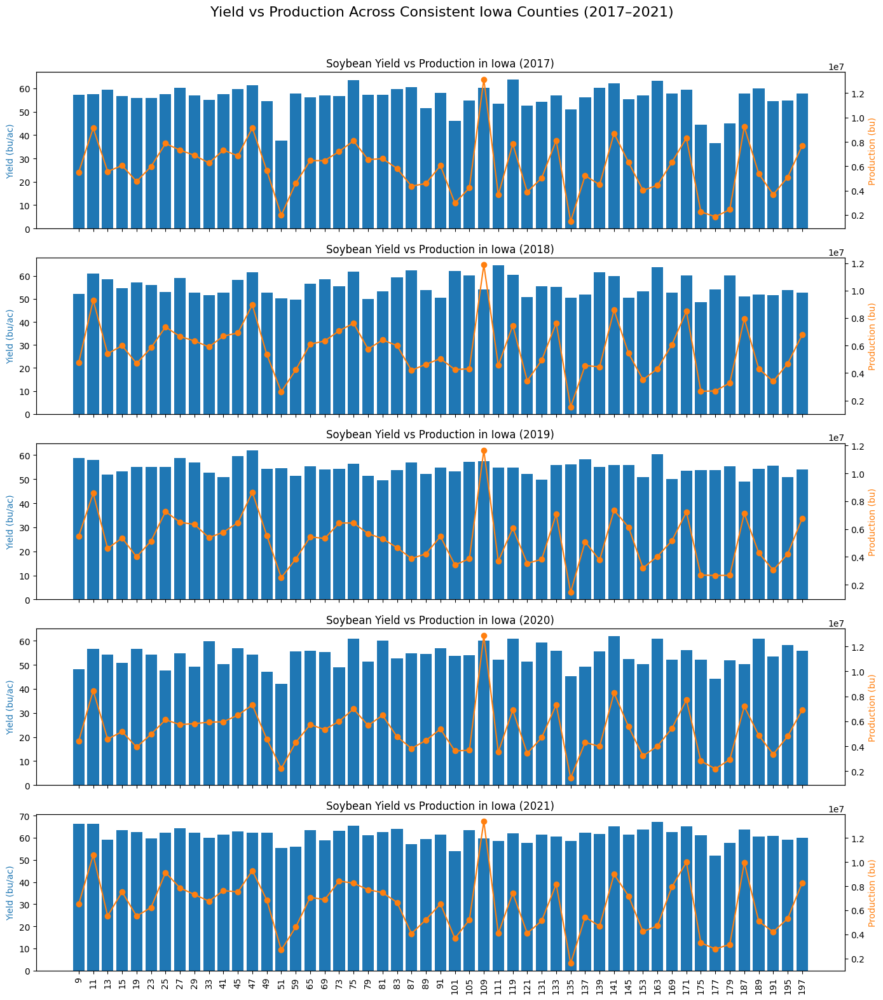

In [9]:
#inspecting usda crop dataset for comprehension: 
#usda_data = USDA_Dataset(usda_root, val_json_path) #usda crop dataset loader
#usda_rel = val_json[0]["data"]["USDA"] #pulling relative usda_soybean_2022.csv (first county is alabama so we will filter later)
#usda_full_path = os.path.join(usda_root, usda_rel) # build system path
#usda_df = pd.read_csv(usda_full_path) #read into df

print("\nPrinting description of yield/production stats for all counties across iowa (2017-2021):")
#Extracting and describing numeric statistics to see spreads of yield and production in bu/ac for each county in iowa on all years.
prod_yield_stats = usda_iowa_consistent[
    ["YIELD, MEASURED IN BU / ACRE","PRODUCTION, MEASURED IN BU"]].describe()
print(prod_yield_stats)
print("\nIowa missing values: ", usda_iowa_consistent.info())#emit df info to verify no missing vals.

# Plot yield vs production for all consistent counties across 2017–2021
years = training_years  # [2017, 2018, 2019, 2020, 2021]
n_years = len(years)

fig, axes = plt.subplots(n_years, 1, figsize=(14, 3.2 * n_years), sharex=True)
fig.tight_layout(pad=3)

for i, year in enumerate(years):
    ax1 = axes[i]
    ax2 = ax1.twinx()

    plot_df = usda_iowa_consistent[usda_iowa_consistent["year"] == year].copy()
    plot_df = plot_df.sort_values("county_ansi")
    plot_df["county_ansi"] = plot_df["county_ansi"].astype(int)

    x = range(len(plot_df))  # even spacing for bars and line

    #Blue bars: yields
    ax1.bar(x, plot_df["YIELD, MEASURED IN BU / ACRE"], width=0.8, color="tab:blue")

    #orange lines: Production
    ax2.plot(x, plot_df["PRODUCTION, MEASURED IN BU"], color="tab:orange", marker="o")

    #labeling:
    ax1.set_ylabel("Yield (bu/ac)", color="tab:blue")
    ax2.set_ylabel("Production (bu)", color="tab:orange")
    ax1.set_title(f"Soybean Yield vs Production in Iowa ({year})")

    #to account for lack of consecutive counties in training data (data problem not ours lol).
    if i == n_years - 1:
        ax1.set_xticks(x)
        ax1.set_xticklabels(plot_df["county_ansi"], rotation=90)
    else:
        ax1.set_xticks([])

plt.suptitle("Yield vs Production Across Consistent Iowa Counties (2017–2021)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [10]:
### print("Estimated Planted Acres Summary Distribubution Across all 97 Counties:")
#print(usda_iowa_acres["area_est"].describe())
#real metric df name: # give it the name you actually want: iowa_county_metrics_df = df_table
usda_iowa_acres = usda_iowa_consistent.copy()

#computing acreage estimate after copying usda_iowa_consistent.
usda_iowa_acres["area_est"] = (
    usda_iowa_acres["PRODUCTION, MEASURED IN BU"] /
    usda_iowa_acres["YIELD, MEASURED IN BU / ACRE"]
)


#Table creation:
iowa_county_metrics_df = usda_iowa_acres[[
    'county_ansi',
    "PRODUCTION, MEASURED IN BU",
    "YIELD, MEASURED IN BU / ACRE",
    "area_est"
]].rename(columns={
    'county_ansi': 'County ANSI',
    "PRODUCTION, MEASURED IN BU":   "Production (BU)",
    "YIELD, MEASURED IN BU / ACRE": "Yield (BU/acre)",
    "area_est":              "Computed Acreage Planted" #prod/yiedl computation from before. 
})
#
#
#regiional table (aggregating production and yield features across all asdi_codes dynamically).
region_map = (
    usda_iowa_acres[["county_ansi", "asd_desc"]]
    .drop_duplicates() #break on repeats.
    .rename(columns={"county_ansi":"County ANSI",
                     "asd_desc":"Region"})
)


iowa_county_metrics_df = iowa_county_metrics_df.merge(region_map, on="County ANSI", how="left")
#group by region for cardinal metric
region_summary = (
    iowa_county_metrics_df
      .groupby("Region")
      .agg(
          Counties       = ("County ANSI",           "count"),
          Total_Production = ("Production (BU)",      "sum"),
          Sum_Acreage      = ("Computed Acreage Planted", "sum"),
          Avg_Yield        = ("Yield (BU/acre)",      "mean")
      )
      .assign(
          Prod_per_Acre = lambda d: d.Total_Production / d.Sum_Acreage #comp.acreage here from before.
      )
      .reset_index()
)
#round away scientific notification on acreage function
region_summary["Sum_Acreage"] = region_summary["Sum_Acreage"].round(0).astype(int)
print("\nRegion Summary (9 USDA regions):")
print(region_summary.to_string(index=False))
# shrink to the four cardinal directions [N,W,S,E] #FOR HRRR-WRF.
def to_cardinal(r):
    r = r.upper() if pd.notna(r) else ""
    if "SOUTH" in r: return "South"
    if "NORTH" in r: return "North"
    if "EAST"  in r: return "East"
    if "WEST"  in r: return "West"
    return "Central"   # base case for "CENTRAL" counties.

iowa_county_metrics_df["Cardinal Region"] = (
    iowa_county_metrics_df["Region"].apply(to_cardinal)
)

cardinal_summary = (
    iowa_county_metrics_df
      .groupby("Cardinal Region")
      .agg(
        Counties         = ("County ANSI",     "count"),
        Total_Production = ("Production (BU)", "sum"),
        Sum_Acreage      = ("Computed Acreage Planted", "sum"),
        Avg_Yield        = ("Yield (BU/acre)", "mean"),
        Prod_per_Acre    = ("Production (BU)", lambda s: s.sum() / iowa_county_metrics_df.loc[s.index,"Computed Acreage Planted"].sum())
      )
      .reset_index()
)

cardinal_summary["Sum_Acreage"] = cardinal_summary["Sum_Acreage"].round(0).astype(int)

print("\nCardinal Region Summary (4 quadrants):")
print(cardinal_summary.to_string(index=False))





Region Summary (9 USDA regions):
       Region  Counties  Total_Production  Sum_Acreage  Avg_Yield  Prod_per_Acre
      CENTRAL        45       286974000.0      5065916  56.362222      56.648001
 EAST CENTRAL        25       144461000.0      2413018  59.864000      59.867360
NORTH CENTRAL        50       320544000.0      5649885  56.510000      56.734608
    NORTHEAST        25       120232000.0      2130582  56.248000      56.431536
    NORTHWEST        20       132554000.0      2285506  57.525000      57.997657
SOUTH CENTRAL        15        39654000.0       755714  52.413333      52.472252
    SOUTHEAST        30        96558000.0      1799351  53.186667      53.662673
    SOUTHWEST        15        87967000.0      1586323  55.426667      55.453404
 WEST CENTRAL        30       215263000.0      3742025  57.370000      57.525799

Cardinal Region Summary (4 quadrants):
Cardinal Region  Counties  Total_Production  Sum_Acreage  Avg_Yield  Prod_per_Acre
        Central        45       2

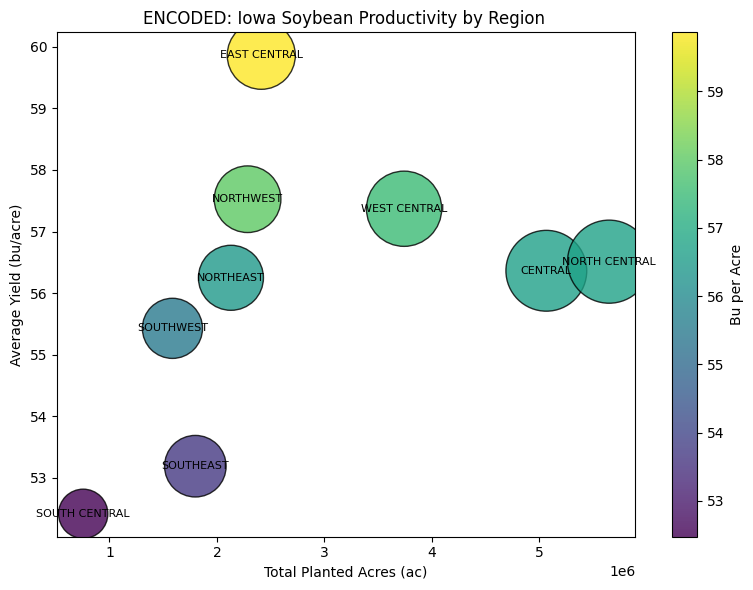

In [11]:
#region-levl bubble-alpha plot encoding:
# choose which summary to plot:
plot_df = region_summary.copy()  #toggle on and of for cardinal data as needed.

fig, ax = plt.subplots(figsize=(8,6))

#size = total production in millions of bu (sqrt(transform)) for compression.
sizes = np.sqrt(plot_df["Total_Production"]) / 1e3



scatter = ax.scatter(
    plot_df["Sum_Acreage"], 
    plot_df["Avg_Yield"],
    s = sizes * 200,          # adjust multiplier for visibility
    c = plot_df["Prod_per_Acre"],
    cmap="viridis",
    alpha=0.8,
    edgecolor="k"
)

# annotate each bubble with asd code
for _, row in plot_df.iterrows():
    ax.text(
        row.Sum_Acreage, row.Avg_Yield, row.Region,
        fontsize=8, ha="center", va="center"
    )

ax.set(
    xlabel="Total Planted Acres (ac)",
    ylabel="Average Yield (bu/acre)",
    title="ENCODED: Iowa Soybean Productivity by Region "
)
plt.colorbar(scatter, label="Bu per Acre")
plt.tight_layout()
plt.show()

#x - total planted acres
#y - avg yield
#bubble size = total productiion 
#color = productivity across state.


    commodity_desc reference_period_desc  year  state_ansi state_name  \
280       SOYBEANS                  YEAR  2017          19       IOWA   
281       SOYBEANS                  YEAR  2017          19       IOWA   
282       SOYBEANS                  YEAR  2017          19       IOWA   
283       SOYBEANS                  YEAR  2017          19       IOWA   
285       SOYBEANS                  YEAR  2017          19       IOWA   

     county_ansi county_name  asd_code      asd_desc domain_desc source_desc  \
280            9     AUDUBON        40  WEST CENTRAL       TOTAL      SURVEY   
281           11      BENTON        60  EAST CENTRAL       TOTAL      SURVEY   
282           13  BLACK HAWK        30     NORTHEAST       TOTAL      SURVEY   
283           15       BOONE        50       CENTRAL       TOTAL      SURVEY   
285           19    BUCHANAN        30     NORTHEAST       TOTAL      SURVEY   

    agg_level_desc  PRODUCTION, MEASURED IN BU  YIELD, MEASURED IN BU / ACRE  \


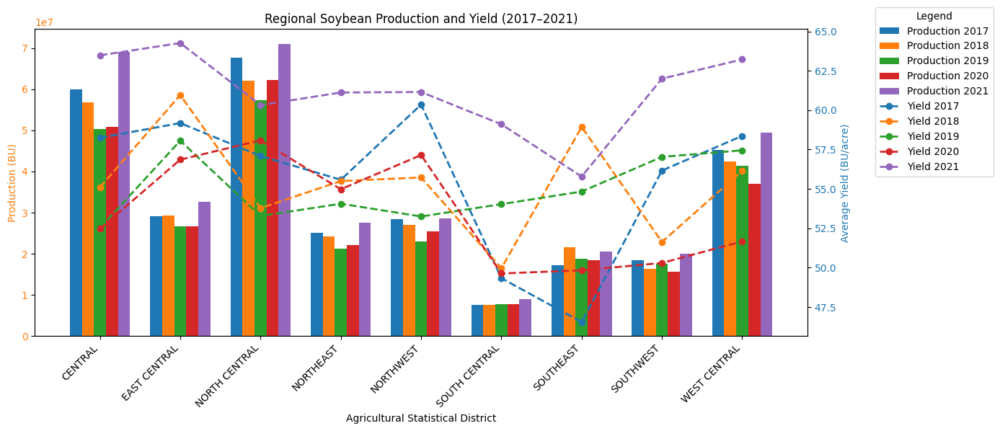

In [12]:
#yearly regional production/yield summary df
region_year_summary = (
    usda_iowa_acres
    .groupby(["asd_desc", "year"])
    .agg(Total_Production=("PRODUCTION, MEASURED IN BU", "sum"),Avg_yield = ("YIELD, MEASURED IN BU / ACRE","mean"))
    .reset_index()
    .rename(columns={"asd_desc": "Region"})
)

print(usda_iowa_acres.head())
#Define a distinct color for each year (both bar and line) for enhanced clarity
colors = {
    2017: "#1f77b4",  # Blue
    2018: "#ff7f0e",  # Orange
    2019: "#2ca02c",  # Green
    2020: "#d62728",  # Red
    2021: "#9467bd"   # Purple
}
#Pivot to wide format for grouped bar plot
prod_pivot = region_year_summary.pivot(index="Region", columns="year", values="Total_Production").fillna(0)
yield_pivot = region_year_summary.pivot(index="Region", columns="year", values="Avg_yield").fillna(0)

#set up production bargraph plot
fig, ax1 = plt.subplots(figsize=(12, 6))
bar_width = 0.15
x = range(len(prod_pivot.index))
#iterate through each years production with its color 
for i, year in enumerate(prod_pivot.columns):
    ax1.bar(
        [pos + i * bar_width for pos in x],
        prod_pivot[year],
        width=bar_width,
        label=f"Production {year}",
        color=colors[year]
    )
#set labelling
ax1.set_ylabel("Production (BU)", color="tab:orange")
ax1.set_xlabel("Agricultural Statistical District")
ax1.tick_params(axis='y', labelcolor="tab:orange")
ax1.set_title("Regional Soybean Production and Yield (2017–2021)")
ax1.set_xticks([pos + bar_width * 2 for pos in x])
ax1.set_xticklabels(prod_pivot.index, rotation=45, ha="right")

#adin twin axis y plotto capture both yields and prod
ax2 = ax1.twinx()
for year in yield_pivot.columns:
    ax2.plot(
        [pos + bar_width * 2 for pos in x],
        yield_pivot[year],
        marker="o",
        label=f"Yield {year}",
        color=colors[year],
        linestyle='--',
        linewidth=2
    )

ax2.set_ylabel("Average Yield (BU/acre)", color="tab:blue")
ax2.tick_params(axis='y', labelcolor="tab:blue")

#Combined legend
fig.legend(loc="upper left", bbox_to_anchor=(1.01, 1), title="Legend")
plt.tight_layout()
plt.show()

#Year by year regional production output:
#central, north central, and west central are the highest producers
#they all produced the highest in 2017 and 2021, they dipped across 2018,2019,2020

80% coverage: 
10th percentile acreage: 58,982 acres
90th percentile acreage: 139,143


Coefficient of Variation (CV) for acreage: 0.337

Correlation matrix between acreage, yield, and production:

                              area_est  YIELD, MEASURED IN BU / ACRE  PRODUCTION, MEASURED IN BU
area_est                          1.00                          0.32                        0.98
YIELD, MEASURED IN BU / ACRE      0.32                          1.00                        0.50
PRODUCTION, MEASURED IN BU        0.98                          0.50                        1.00


Z- yield threshold: +/- 1.49

Yield Shockers: Iowa’s Best and Worst Performing Counties:

 year  county_ansi  YIELD, MEASURED IN BU / ACRE   z_yield
 2019            9                          58.9  1.520895
 2021            9                          66.4  1.673979
 2017           51                          37.6 -3.327812
 2020           51                          42.0 -2.625007
 2021           51         

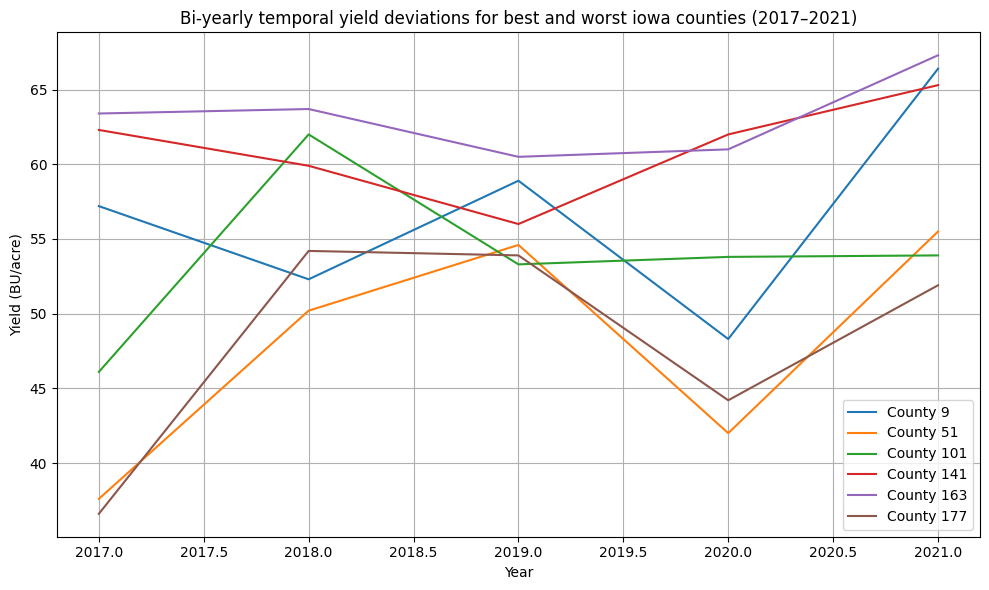

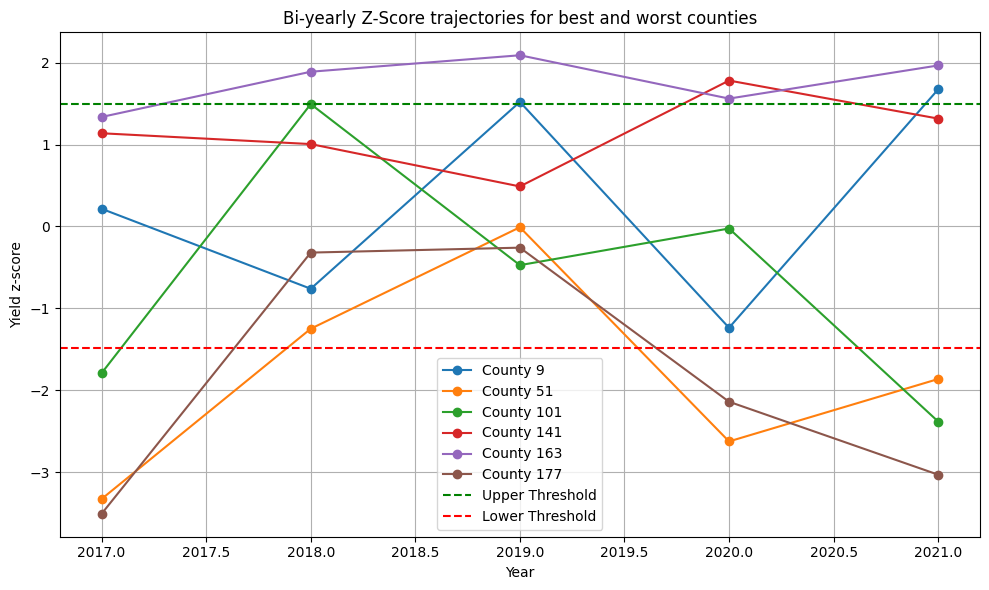

In [13]:
####
#Exploring variation and outliers in usda dataset, focusing on 
#planted acreage, yield, and production.

#Tail distribution and CV on 10th and 90th percentiles to view skewage 
# and small/large acreage summaries across counties, regions, cardinals.
p10, p90 = usda_iowa_acres["area_est"].quantile([0.1, 0.9])
print(f"80% coverage: \n10th percentile acreage: {p10:,.0f} acres\n90th percentile acreage: {p90:,.0f}\n")

#coefficent of variation 
#measured by std/maen to measure relative spread and variability of our counties in terms of planted accreage 
cv = usda_iowa_acres["area_est"].std() / usda_iowa_acres["area_est"].mean()
print(f"\nCoefficient of Variation (CV) for acreage: {cv:.3f}")
#high spread = planting sizes vary
#low = planting sizes are similar. 

#Correlation mtx to compute correlation coeff across area_est, yield, and prod to understand models better:
corr = usda_iowa_acres[[
    "area_est", "YIELD, MEASURED IN BU / ACRE", "PRODUCTION, MEASURED IN BU"
]].corr()
print("\nCorrelation matrix between acreage, yield, and production:\n")
#acreage/pr = 0.98 = more planting equals more bu #Obvious
#acreage/yi = 0.32 = planting doesnt mean higher yields
#yield -> production = 1/2 = volume is driven by acreage.
print(corr.to_string(float_format="{:,.2f}".format))
print("\n")

#computing z-scores of yields to identify rows that are high / low in yields across data to 
#comprhened performance and further investigation:
iowa_county_metrics_df["z_yield"] = zscore(iowa_county_metrics_df["Yield (BU/acre)"])


#visualizing variations and outliers W/ acreage distriubution and correlation:
z_df = usda_iowa_consistent.copy()
z_df["z_yield"] = z_df.groupby("year")["YIELD, MEASURED IN BU / ACRE"].transform(zscore)

#picking a zscore threshold of +- 1.49 to capture about 86% of the data, and flagging top/bottm performers
#more inclusively to identify high, low, and mild outliers.
outlier_years = z_df[z_df["z_yield"].abs() > 1.49]
print("Z- yield threshold: +/- 1.49\n")
print("Yield Shockers: Iowa’s Best and Worst Performing Counties:\n")
#print(outlier_years[["year", "county_ansi", "YIELD, MEASURED IN BU / ACRE", "z_yield"]])

#outputting problematic counties in terms of yields and z_score yield.
#county 19177 is consisntely underperforming
#51 and 1001 not as bad but certainly a poor performing region.
#counties 9, 141, and 163 had great years.

#Lest investigate our outlier counties even more: 
outlier_counties_track = [9,51,101,141, 163, 177]
yield_shockers_focus = z_df[
    (z_df["county_ansi"].isin(outlier_counties_track)) &
    (z_df["z_yield"].abs() > 1.49)
][["year", "county_ansi", "YIELD, MEASURED IN BU / ACRE", "z_yield"]].sort_values(["county_ansi", "year"])
print(yield_shockers_focus.to_string(index=False))



#Creating plot for these counties over time to visualize their performance metrics (yield, z-score)
plt.figure(figsize = (10,6))

for zip in outlier_counties_track:
    subzip = z_df[z_df["county_ansi"] == zip]
    plt.plot(subzip["year"], subzip["YIELD, MEASURED IN BU / ACRE"], label=f'County {zip}')

plt.xlabel("Year")
plt.ylabel("Yield (BU/acre)")
plt.title("Bi-yearly temporal yield deviations for best and worst iowa counties (2017–2021)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
for zip in outlier_counties_track:
    subset = z_df[z_df["county_ansi"] == zip]
    plt.plot(subset["year"], subset["z_yield"], marker='o', label=f'County {zip}')

plt.axhline(y=1.49, color='green', linestyle='--', label="Upper Threshold")
plt.axhline(y=-1.49, color='red', linestyle='--', label="Lower Threshold")

plt.xlabel("Year")
plt.ylabel("Yield z-score")
plt.title("Bi-yearly Z-Score trajectories for best and worst counties")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [15]:
#Load and align my historical USDA cropnet data for iowa with WRF-HRRR [High-Res Rapid Refresh Model w/ Weather Research and Forecasting model]
hrrr_root = os.path.join(project_path, "TinyCropNet", "WRF-HRRR", "data")
#retrieve 2017–2021 HRRR weather files for iowa
hrrr_dfs = [] #storage df.
for yr in range(2017, 2022):
    year_path = os.path.join(hrrr_root, str(yr), "IA", "HRRR_*.csv")
    hrrr_dfs += [pd.read_csv(f).assign(year=yr) for f in glob.glob(year_path)]

hrrr_all = pd.concat(hrrr_dfs, ignore_index=True)
print("Loaded HRRR shape:", hrrr_all.shape) #1.9 mill rows, 24 features
#print("\nWRF-HRRR Quick Peek:",hrrr_all.tail(1))


#Filter outlier by counties and clean for mmst-vit:
#Note: we are using our 6 counties that were previouslsy identified as outliers previously identified from z-yields above.
#this is because mmst-vit is very expensive and time consuming to run on all 99 counties of iowa
#still meaningfull and worthwhile to run data on these 6 counties though.

#Clean up and extract wanted weather/date/fips features:
hrrr_all = hrrr_all[hrrr_all["Daily/Monthly"].str.upper() == "MONTHLY"] #keep only monthly vals.
hrrr_all = hrrr_all.dropna(subset=["FIPS Code", "Year", "Month"])
hrrr_all["Month"] = hrrr_all["Month"].astype(int)
hrrr_all["county_ansi"] = hrrr_all["FIPS Code"] % 1000

#iltering down to identified [6[ outlier counties from usda data:
outlier_counties_track = [9, 51, 101,141, 163, 177]
#filter on only monthly for outlier counties.
hrrr_outliers = hrrr_all[(hrrr_all["county_ansi"].isin(outlier_counties_track))].copy()
numeric_cols = hrrr_outliers.select_dtypes(include=[float]).columns.tolist() #taking wrf-hrrrparameters as list.


#and storing in weather_feat variable. 
#while dropping fips, day, grid index, lat/long features as spatial variability is not useful here.
weather_features = [c for c in numeric_cols
                    if c not in ["FIPS Code","Day","Grid Index", "Lat (llcrnr)",
                                 "Lon (llcrnr)", "Lat (urcrnr)", "Lon (urcrnr)"]]

print("Unique outlier counties:", hrrr_outliers["county_ansi"].unique()) #verify that only weather params [min,max temp, precip, humid, wind..].
#verify only monthly records are being pulled:
unique_daily_monthly_records = hrrr_outliers["Daily/Monthly"].unique()
print("Unique values in 'Daily/Monthly' in hrrr_outliers:", unique_daily_monthly_records)
print("Weather features used:\n", weather_features[:7], "...") #quick peek into parameters.

#Group by county and year for seasonal aggregation (Apr–Sep) -> in alignment with both usda and future senitnel-2 imagery uses.
hrrr_outliers["Month"] = hrrr_outliers["Month"].astype(int)
hrrr_growing_szns = hrrr_outliers[hrrr_outliers["Month"].between(4, 9)] #months april...
unique_growing = hrrr_growing_szns["Daily/Monthly"].unique()
print("Unique values for 'Daily/Monthly' in hrrr_growing:", unique_growing)

weather_summary = (
    hrrr_growing_szns
    .groupby(["county_ansi", "year"])[weather_features]
    .agg(["mean", "std"])
)

#important: flatten df and merge with usda yields.
weather_summary.columns = [f"{col}_{stat}" for col, stat in weather_summary.columns]
weather_summary = weather_summary.reset_index()
print("\nWeather summary statistics and shape:", weather_summary.shape) # 6 counties, 6 years, 36 rows. (w/ 18 x mean and std (2) features) to make 36 cols.s
print(weather_summary.head(2))

Loaded HRRR shape: (2383392, 24)
Unique outlier counties: [  9  51 101 141 163 177]
Unique values in 'Daily/Monthly' in hrrr_outliers: ['Monthly']
Weather features used:
 ['Avg Temperature (K)', 'Max Temperature (K)', 'Min Temperature (K)', 'Precipitation (kg m**-2)', 'Relative Humidity (%)', 'Wind Gust (m s**-1)', 'Wind Speed (m s**-1)'] ...
Unique values for 'Daily/Monthly' in hrrr_growing: ['Monthly']

Weather summary statistics and shape: (30, 24)
   county_ansi  year  Avg Temperature (K)_mean  Avg Temperature (K)_std  \
0            9  2017                291.949625                 4.905656   
1            9  2018                291.729655                 6.836208   

   Max Temperature (K)_mean  Max Temperature (K)_std  \
0                298.134145                 4.740401   
1                297.967519                 6.172070   

   Min Temperature (K)_mean  Min Temperature (K)_std  \
0                286.667647                 4.658474   
1                286.584101          

In [16]:
#[sub]-Merging with USDA_IOWA_CONSISTENT (w/ same counties, years, regions, cardinality, plus yields, comp.acreage and production stats!
usda_filtered_6counties = usda_iowa_consistent[(usda_iowa_consistent["county_ansi"].isin(outlier_counties_track)) 
                            &(usda_iowa_consistent["year"].between(2017, 2021))].copy() #copy for merge.

#Merge (inner join) on ['county_ansi', 'year'] in wrf-hrr.
usda_weather_merged = usda_filtered_6counties.merge(
    weather_summary, on=["county_ansi", "year"], how="inner"
)
#print("Merged USDA + Weather shape:", usda_weather_merged.shape) 30 rows, 36 cols (12 weather and 24 total).

#Using usda_weather_merged to produce actual yields, z-scores for yield and weather
#*matching it with fips, year, region, cardinal
usda_weather_merged["z_yield"] = zscore(usda_weather_merged["YIELD, MEASURED IN BU / ACRE"])
weather_z_cols = [col for col in usda_weather_merged.columns if col.endswith("_mean")] # getting z*mean for now 

#iterating through each column to get z_score std
# Loop through each weather feature and compute z-score
for col in weather_z_cols:
    col_std = usda_weather_merged[col].std()
    if col_std > 0:
        usda_weather_merged[f"z_{col}"] = zscore(usda_weather_merged[col])
    else:
        usda_weather_merged[f"z_{col}"] = 0  # or np.nan .

print("Computed z-scores for yield and relevant weather features:\n")


## preview key stats sample for verif.
#each row now contains county, year, region | 
#usda target vals[yield,acreage,prod] | 
#wrf-hrrr weather summaries [mean temp..]
#z-scores for comparison to see anomolies and impacs on these counties: [z_yield, z_temp...]

print(usda_weather_merged[[  
    "county_ansi", "year", "YIELD, MEASURED IN BU / ACRE", "z_yield"
] + [f"z_{col}" for col in weather_z_cols[:12]]]) # just showing 3 z-cols for space
print([c for c in usda_weather_merged.columns if c.startswith("z_")])


Computed z-scores for yield and relevant weather features:

    county_ansi  year  YIELD, MEASURED IN BU / ACRE   z_yield  \
0             9  2017                          57.2  0.258816   
1            51  2017                          37.6 -2.207699   
2           101  2017                          46.1 -1.138037   
3           141  2017                          62.3  0.900614   
4           163  2017                          63.4  1.039041   
5           177  2017                          36.6 -2.333542   
6             9  2018                          52.3 -0.357813   
7            51  2018                          50.2 -0.622082   
8           101  2018                          62.0  0.862861   
9           141  2018                          59.9  0.598591   
10          163  2018                          63.7  1.076793   
11          177  2018                          54.2 -0.118712   
12            9  2019                          58.9  0.472749   
13           51  2019         

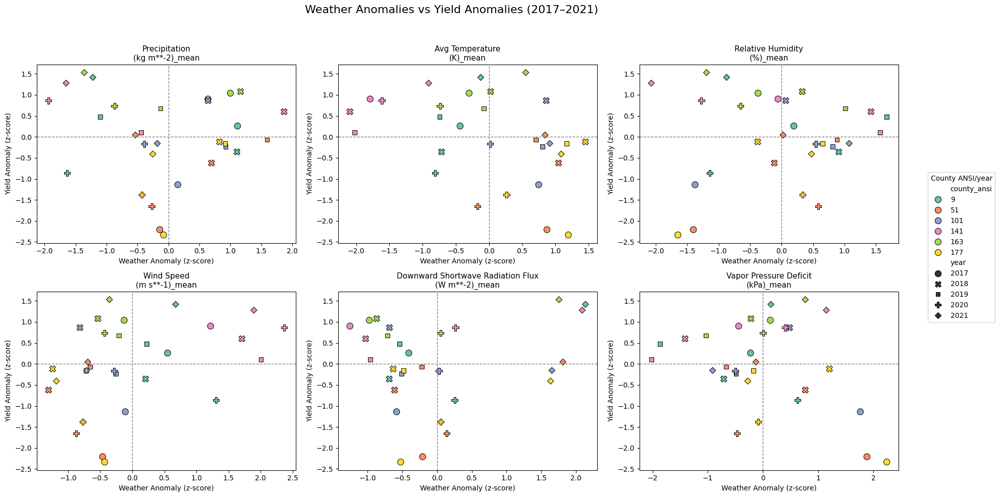

In [17]:
#Lets now examine z scores anomolies in relation to yield anomalies:
#Every monthly weather variable is averaged for a yearly aggregation analysis: 

#Using z-weather columns that were outliers. 
selected_z_cols = [
    "z_Precipitation (kg m**-2)_mean",
    "z_Avg Temperature (K)_mean",
    "z_Relative Humidity (%)_mean",
    "z_Wind Speed (m s**-1)_mean",
    "z_Downward Shortwave Radiation Flux (W m**-2)_mean",
    "z_Vapor Pressure Deficit (kPa)_mean"
]
#set up multi panel plot per selected z feature:
fig, axes = plt.subplots(2, 3, figsize=(18, 10)) #sharing x and y axis to reduce plot complexity
axes = axes.flatten()  #flatten for iterations


#iterate through each column scatterplot visuals.
#each shape denotes the year, each color denotes one of the outlier county
for i, col in enumerate(selected_z_cols):
    ax = axes[i]
    sns.scatterplot(
        data=usda_weather_merged,
        x=col,
        y="z_yield",
        hue="county_ansi", #color by outlier county_ansi 
        style='year', #encode year [17-21]
        palette="Set2", #categorial pallete by county
        edgecolor="black",
        s=80,
        ax=ax, 
        legend = 'brief' if i == 0 else False) #only do this once for global legend.

    #surpress the legend from subplot 1 to avoid legend population inside.
    if i == 0:
        handles, labels = ax.get_legend_handles_labels()
        ax.legend_.remove() if ax.legend_ else None
        
    #settings and y,x,z axis's
    ax.axhline(0, color="gray", linestyle="--", linewidth=1)
    ax.axvline(0, color="gray", linestyle="--", linewidth=1)
    ax.set_title(col.replace("z_", "").replace(" (", "\n("), fontsize=11)
    ax.set_xlabel("Weather Anomaly (z-score)")
    ax.set_ylabel("Yield Anomaly (z-score)")

# lobal legend for all 6 plot.
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title="County ANSI/year",loc="center left",bbox_to_anchor=(1.02, 0.5))

#titles,legend, and laying out all 6 plots 
plt.suptitle("Weather Anomalies vs Yield Anomalies (2017–2021)", fontsize=16) #overall title
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



USDA/WRF-HRR feature Correlations w/ Yield Anomoalies:
Avg Temperature
(K)_mean: -0.402
Wind Speed
(m s**-1)_mean: 0.361
Vapor Pressure Deficit
(kPa)_mean: -0.349
Downward Shortwave Radiation Flux
(W m**-2)_mean: 0.177
Precipitation
(kg m**-2)_mean: -0.084
Relative Humidity
(%)_mean: 0.076


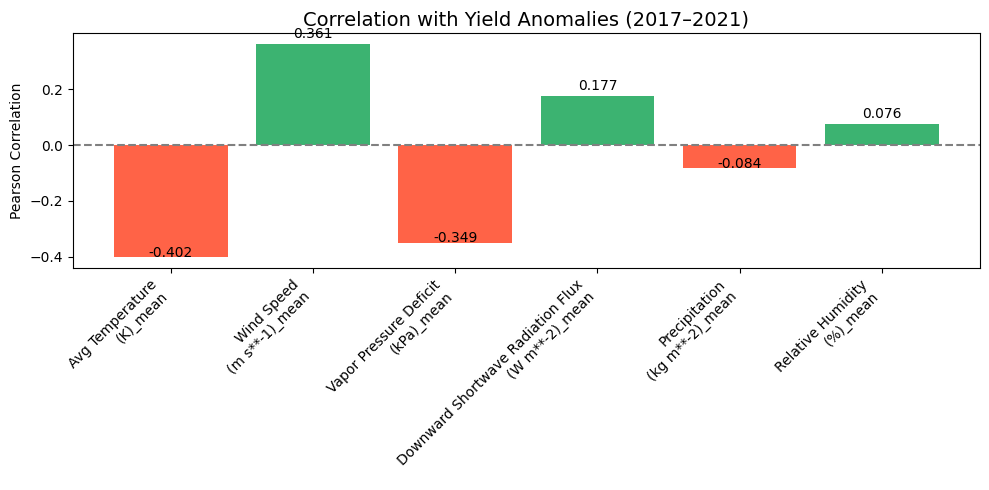

R² score: 0.272


In [18]:
#Quantifying the strenght of relationships on weather yields vs soybean yields:
#Answers: Which weather anomalies are most associated with yield anomalies?

relationships = {}
for col in selected_z_cols:
    correlations = usda_weather_merged[[col,"z_yield"]].corr().iloc[0,1]
    relationships[col.replace("z_","").replace(" (","\n(")] = correlations

#sort by most correlated features to least:
sorted_corr_features = sorted(relationships.items(), key=lambda x: abs(x[1]), reverse=True)
print("\nUSDA/WRF-HRR feature Correlations w/ Yield Anomoalies:")
# Convert sorted_corr_features into two lists:
features = [item[0] for item in sorted_corr_features]
correlations = [item[1] for item in sorted_corr_features]

for feature, corr in sorted_corr_features:
    print(f"{feature}: {corr:.3f}") #iteatively print out z_score weather-yield relationships across outlier counties and all years:

#bar chart for visual representation:
plt.figure(figsize=(10, 5))
bars = plt.bar(features, correlations, color=["tomato" if v < 0 else "mediumseagreen" for v in correlations])
plt.axhline(0, color="gray", linestyle="--")
plt.title("Correlation with Yield Anomalies (2017–2021)", fontsize=14)
plt.ylabel("Pearson Correlation")
plt.xticks(rotation=45, ha="right")

#placingweather feature z_scores on top
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01*np.sign(yval), f"{yval:.3f}", ha="center", va="bottom", fontsize=10)

plt.tight_layout()
plt.show()


#Tells us negative/positive correlations with yields:
#negatives: avg temp, vpd (dry/wet atmospheric condition), precip 
#-> drier = drought stressed yields | higher temps -> less yields | higher rain -> doesn't mean much [weak neg]
#positive: humidity, radiation flux (sunlight), wind speed
#-> humidity -> nearly uncorrelate |  rf/sunlight -> slight yield benefit | wind -> better yields (good positive)
#key stressor: temp, vpd = yield drop | wind = yield plus

# storing (z-yield and top 3-4 correlated weather features) in dict.
# Define the correct feature names based on your actual DataFrame
feature_cols = [
    "z_Avg Temperature (K)_mean",
    "z_Wind Speed (m s**-1)_mean",
    "z_Vapor Pressure Deficit (kPa)_mean",
    "z_Downward Shortwave Radiation Flux (W m**-2)_mean" #optinall 4th feature despite small neg corr but keeping it at 2 pos/ 2 neg for now.
]

#defining x input features as weather feature cols
X = usda_weather_merged[feature_cols]
#target/predicting z_yields column as our outcome var.
y = usda_weather_merged["z_yield"]

#fitting a simple regression model on x,y for bestfit to min mse on yield anomlies and weather featrures.
model = LinearRegression().fit(X, y)
y_pred = model.predict(X) #guessing on every county by year yields.

#measuring variance between y and x [1 - (y_pred anomolies/ total variation in y)]
#shows us prediction error:
from sklearn.metrics import r2_score
r2 = r2_score(y, y_pred)
print(f"R² score: {r2:.3f}")

#0.272 r2 = Weak relationship, predictors only help a bit [only explains 27% of the yield variation].

RMSE score: 0.115
R² score: 0.885


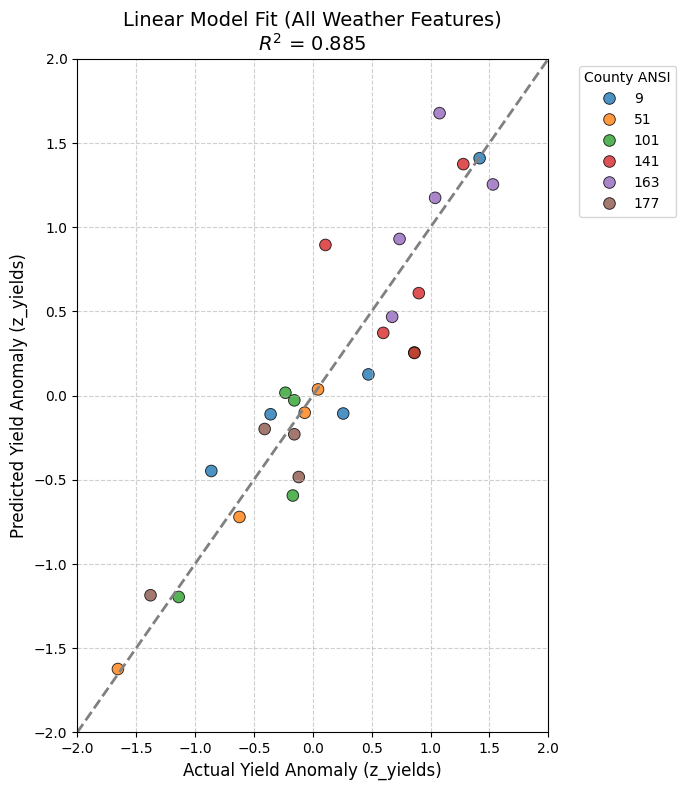

/var/folders/v0/cv7w3yvx4kngj01jlbzhzt_r0000gn/T/ipykernel_53227/3379018928.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=importance_df, x="Abs_Coefficient", y="Feature", palette="viridis")


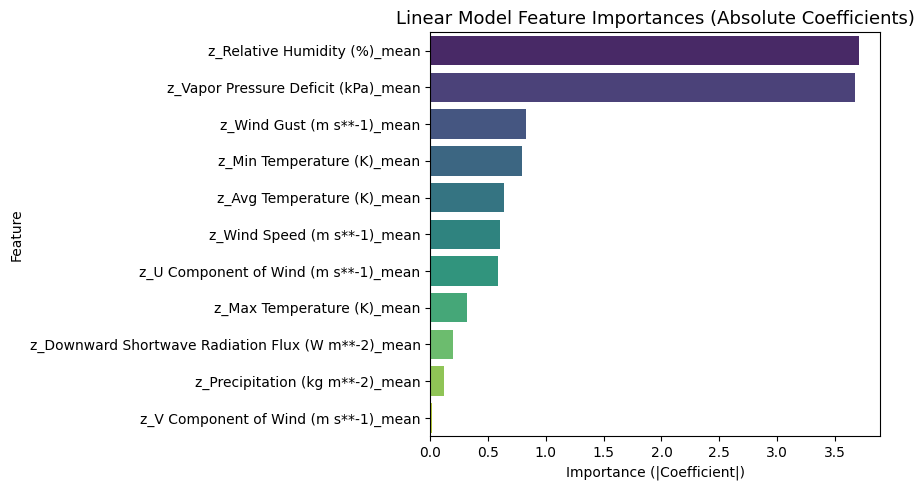

In [19]:
#Expnading all z-score weather features (exclude target variable) on model after poor r2 on top 3 features.
#This tells us that our standardized features and top 4 features do not totaly capture the variance and explain our yields well.
#Now, we want to try and allow our linear model to learn patterns that our previously correlations didn't express.

all_weather_z_cols = [col for col in usda_weather_merged.columns 
                      if col.startswith("z_") and col != "z_yield"]
#redefining input and target on all weeather cols now.
X = usda_weather_merged[all_weather_z_cols]
y = usda_weather_merged["z_yield"]

model = LinearRegression().fit(X, y)
y_pred = model.predict(X)

#Recompute R^2 score with all learned features from our linear model.
r2 = r2_score(y, y_pred)
from sklearn.metrics import mean_squared_error, r2_score
rmse = mean_squared_error(y,y_pred)
print(f"RMSE score: {rmse:.3f}")
print(f"R² score: {r2:.3f}")

#Assembling our multivarite linear model to plot actual vs predicted yield anomalies
plt.figure(figsize=(7, 8))
sns.scatterplot(x=y, y=y_pred, hue = usda_weather_merged["county_ansi"].astype(str), edgecolor='black', s=70, alpha=0.8)
plt.plot([-2, 2], [-2, 2], linestyle="--", color="gray", linewidth=2)
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.xlabel("Actual Yield Anomaly (z_yields)", fontsize=12)
plt.ylabel("Predicted Yield Anomaly (z_yields)", fontsize=12)
plt.title(f"Linear Model Fit (All Weather Features)\n$R^2$ = {r2:.3f}", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="County ANSI", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

#supplementing our scatter plot with feature importance to reflect what each plotted point is what feature.
#grab feature names and coefficients
coefs = model.coef_
importance_df = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": coefs,
    "Abs_Coefficient": np.abs(coefs)
}).sort_values(by="Abs_Coefficient", ascending=False)

#y-axis feature bar chart feature importance plot:
plt.figure(figsize=(9, 5))
sns.barplot(data=importance_df, x="Abs_Coefficient", y="Feature", palette="viridis")
plt.title("Linear Model Feature Importances (Absolute Coefficients)", fontsize=13)
plt.xlabel("Importance (|Coefficient|)")
plt.tight_layout()
plt.show()

#Note on output: 
#rmse-> 0.115 -> very small error
#r2 = 88.5% variance -> great for a regressin model.


In [20]:
#hyper-param tuning for ridge regression.

#defining alpha vals on a log-based scale to find best alpha(regularization)
alphas = np.logspace(-3,3,50) #0.001 -> 1000

#Referncing ridgeCV through instatiation, alpha ^^
ridge_cv = RidgeCV(alphas=alphas, store_cv_values=True)  # store_cv_values=True 

#Fitting our inst. ridgecv model on our full feature set X, y
ridge_cv.fit(X, y)
print(f"Best alpha found: {ridge_cv.alpha_}") # printing optimal alpha.

#make predictions on our target Y using ridgeCV model.
y_pred_ridgecv = ridge_cv.predict(X)

#evaluating model performance with rmse and r2 metrics
rmse = mean_squared_error(y, y_pred_ridgecv) ** 0.5
r2 = r2_score(y, y_pred_ridgecv)
print(f"RMSE: {rmse:.3f}")
print(f"R²:   {r2:.3f}")

#ridge helped regularize wihtout killing too much performance | 0.01 was good, but 0.02... penalty/ alpha gives us a worse rmse but better r2.

'''"Using RidgeCV, an optimal alpha of 0.03 was selected, resulting in an R² of 0.883, 
demonstrating robust predictive performance with minimal regularization.'''



Best alpha found: 0.029470517025518096
RMSE: 0.342
R²:   0.883


/Users/aubayazzarouk/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_ridge.py:2385: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


'"Using RidgeCV, an optimal alpha of 0.03 was selected, resulting in an R² of 0.883, \ndemonstrating robust predictive performance with minimal regularization.'

In [21]:
#creating a new soybean_val.json file for our 6 outlier counties to avoid retraining and computing costs of running the mmst-vit model. 
#this is to run inference loop to map fips and years to actual data files from sent2, wrf-hrr, and usdacropdataset.
outlier_fips_code = ["19009", "19051", "19101","19141","19163", "19177"]
years = [2017,2018,2019,2020,2021]
#creating a list of dicts for fips per year: 

samples = []
for fips in outlier_fips_code: 
    for year in years:
        samples.append({"FIPS": fips, "Year": year})
        
#saving to json data dir :
val_json_path = "soybean_val_outliers.json"
with open(val_json_path, "w") as f: 
    json.dump(samples, f, indent = 2)
with open(val_json_path, "r") as f: #reading our new outlier counties JSON file.
    val_json = json.load(f)

print(f"New validation JSON created at {val_json_path}")
print(f"Loaded {len(val_json)} rows | GOOD")
print(val_json[:3])# print first 3 to verify structure

New validation JSON created at soybean_val_outliers.json
Loaded 30 rows | GOOD
[{'FIPS': '19009', 'Year': 2017}, {'FIPS': '19009', 'Year': 2018}, {'FIPS': '19009', 'Year': 2019}]


In [22]:
#beginning inference code to loop over the 6 counties on 6 years and getting predictions.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") #use cuda if computer units permit, cpu otherwise.
#Every sentinel-2 hdf5 contains 2 quarters of each year | optimal for users with disk, storage, gpu limits.

#instantiate our PVT-SimCLR backbone [ViT = Vision Transformer)
pvt = PVTSimCLR(
    base_model="pvt_tiny", #backbone reference ; 'tiny' is the lighter/faster version of pyramid vision transforming.
    out_dim=512, #dimension size of feature embeddings from backbone (for sentinel-2 imagery going through vit).
    context_dim=9, #size of hrrr + usda input [9 features (weather + yields) that gets fed into model w images.
    pretrained=False  # manually load weights instead of defaults vals.
)

#Assemble our ready-to-go mmst-vit model through attaching PvT backbone and context processing head.
model = MMST_ViT( 
    out_dim=2, #we just want to output 2 dim (a.k.a : mean + std predictions)
    pvt_backbone=pvt,
    context_dim=9, 
    dim=512,
    batch_size=64 #64 was used during training but 64 is a good number for processing/iterations [memory expensive although].
)

#loading pre-trained MMST-ViT model from checkpoint (#198  == 200th epoch).
#uses modelweights from prior fine-tuning in mmst-vit class.
checkpoint_path = "/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/output_dir/mmst_vit/checkpoint-198.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint["model"])

#move model to 'applicable' gpu/cpu and evaluate:
model.to(device)
model.eval()


MMST_ViT(
  (pvt_backbone): PVTSimCLR(
    (backbone): PyramidVisionTransformer(
      (patch_embed1): PatchEmbed(
        (proj): Conv2d(3, 64, kernel_size=(4, 4), stride=(4, 4))
        (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
      )
      (pos_drop1): Dropout(p=0.0, inplace=False)
      (block1): ModuleList(
        (0-1): 2 x Block(
          (norm1): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (q): Linear(in_features=64, out_features=64, bias=True)
            (kv): Linear(in_features=64, out_features=128, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=64, out_features=64, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
            (sr): Conv2d(64, 64, kernel_size=(8, 8), stride=(8, 8))
            (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
          )
          (drop_path): Identity()
          (norm2): LayerNorm((64,

In [23]:
#running full-inference loop on 2017-2021 counties and years. 
#purpose: to simulate and generate predictions  w/ deep learning, multi modalities and away from basic regression/correlation learning
#
#We want to compare our ridge, linear regression, and rf baseline models against the quality of mmst_vit w/ r2, rmse, etc...
#with the same data [2017-2021 outliers *6 counties and their respective yet historical z-scores]
#
#Output: predicted values for each fips, year pair.

In [24]:
#Sentinel-2 to return tensor with neutral 4d tensor and preprocessed input dimensions  (channel, time, height, width).
#(without batch and grid)

def load_sentinel_2(fips, year): 
    image_tensors = torch.zeros((3,6,384,384)) #3 channels, 6 timesteps(months), h x w=384.
    return image_tensors
    
#wrf-hrrr + usda data loader to return 6 or 2 d tensor (dependent on long/short term inference preferance).
def load_hrrr_usda_features(fips,year):
    #re-referencing usda and hrrr dir.path files. 
    #Loading hrrr and usda features from tinycropnet. 
    #output long term features. (and short if desired)
    hrrr_root = "/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/TinyCropNet/WRF-HRRR/data"
    usda_root = "/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/TinyCropNet/USDA Crop Dataset/data/Soybean"


    #hrrr loading...
    hrrr_files = []
    #for every row, pull iowa entries by year and month 
    for month in range(4, 10):  #4 = April, 9 = September, not incl. 10.
        month_file = os.path.join(hrrr_root, str(year), "IA", f"HRRR_19_IA_{year}-{month:02d}.csv")
        #append each file into hrrr stored list.
        if os.path.exists(month_file):
            hrrr_files.append(month_file)
    
    #raise error if hrrr_files lst is not populated.
    if not hrrr_files:
        raise FileNotFoundError(f"No HRRR files found for FIPS {fips} year {year} (Apr–Sep).")

    #reading/ each file(csv) and concat. into a df w/ each respective month.
    hrrr_dfs = []
    for wrf_csv in hrrr_files:  
        hrrr_dfs.append(pd.read_csv(wrf_csv))
    hrrr_df = pd.concat(hrrr_dfs, ignore_index=True)

    #clean fips andd monthly fields.
    hrrr_df["FIPS Code"] = hrrr_df["FIPS Code"].astype(str).str.zfill(5)
    hrrr_df["Daily/Monthly"] = hrrr_df["Daily/Monthly"].astype(str).str.strip().str.capitalize()

    #filtering monthly data by fips_code.
    monthly_weather_features = hrrr_df[
        (hrrr_df["FIPS Code"] == fips) &
        (hrrr_df["Daily/Monthly"] == "Monthly")
    ]
    #raise error if filter fails by fips or month
    if monthly_weather_features.empty:
        raise ValueError(f"No HRRR data for FIPS {fips}, year {year}")

    
    wrf_outlier_features = [
        'Avg Temperature (K)', 'Max Temperature (K)', 'Min Temperature (K)',
        'Precipitation (kg m**-2)', 'Relative Humidity (%)', 
        'Wind Gust (m s**-1)', 'Wind Speed (m s**-1)', 
        'Downward Shortwave Radiation Flux (W m**-2)', 'Vapor Pressure Deficit (kPa)'
    ]
    
    hrrr_shaped_data = monthly_weather_features[wrf_outlier_features].mean().values  
    #(9 features), every cty per month is averaged for one output shape.
    #quick peek: 
    print(hrrr_shaped_data)

    #step 2
    #loading usda crop dataset features and point to usda_file by year,csv: 
    usda_year_path = os.path.join(usda_root, str(year))
    usda_file = os.path.join(usda_year_path, f"USDA_Soybean_County_{year}.csv")

    #raise error if files cannot be found:
    if not os.path.exists(usda_file):
        raise FileNotFoundError(f"USDA file not found: {usda_file}")

    #read files into df and fill in county_ansi with proper format.
    usda_inf_df = pd.read_csv(usda_file)
    #standardize county_ansi column to have 3 digits for fips. 
    usda_inf_df["county_ansi"] = usda_inf_df["county_ansi"].astype(str).str.zfill(3)

    #extract soybean yields by county_ansi[last 3 dig].
    soybean_yield_counties = usda_inf_df[usda_inf_df["county_ansi"] == fips[-3:]]["YIELD, MEASURED IN BU / ACRE"]
    #raise error if yields are not retrieved:
    if soybean_yield_counties.empty:
        raise ValueError(f"No USDA yield data for FIPS {fips}, year {year}")

    
    log_soybean_yield = np.log(soybean_yield_counties.values[0]) #taking the log each yield/target pred.

    #Concatenate HRRR + USDA into 
    multimodalfeatures = np.concatenate([hrrr_shaped_data, [log_soybean_yield]])

    return torch.tensor(multimodalfeatures, dtype=torch.float32)


In [25]:
#run example load on our first outlier county in the state of iowa for april-sept, 2017.
_ = load_hrrr_usda_features("19009", 2017) #Audubon County, IA

[2.91949625e+02 2.98134145e+02 2.86667647e+02 4.16240297e+00
 7.21866687e+01 6.13618270e+00 3.50357099e+00 5.81773332e+03
 7.34587356e-01]


In [26]:
#re-loading soybean_val_outliers.json [6 county samples] for inference safety purposes.
with open(val_json_path, "r") as f:
    val_json = json.load(f)
print(f"Loaded {len(val_json)} samples.")

#preparing to store results in a list
results = []
missing_samples = [] #just incase. 
#beginning inf loop:

Loaded 30 samples.


In [27]:
print("\nStarting Inference with our enhanced data loaders:\n")

#Results storage
results = [] #lst to store succesful rows for inferences/predictors.
missing_samples = [] #failed samples

for idx, sample in enumerate(tqdm(val_json, desc="Running Inference")):
    fips = sample["FIPS"]
    year = sample["Year"]

    print(f"\n[Sample {idx+1}] Starting with outlier FIPS {fips}, for the year {year}...")

    try:
        #loading sentinel-2 by soybean_outliers fips and year keys.
        x_sen = load_sentinel_2(fips, year)  # (3,6,384,384)
        x_sen = x_sen.unsqueeze(0)            # Add batch dimension [1, C, T, H, W]

        x_sen = x_sen.permute(0, 2, 1, 3, 4)  #reorder for mmst-vit model tensors [1, T, 1, C, H, W]
        x_sen = x_sen.unsqueeze(2)  #add grid dim (singleton dimension)

        #loading WRF-HRRR and USDA Crop data features
        x_ctx = load_hrrr_usda_features(fips, year)  #(10,) => first 9 HRRR, last 1 USDA yield
        
        #split into short-term and long-term inputs:

        x_ctx_short = x_ctx[:9].reshape(1, 1, 1, 1, 9).expand(-1, 6, -1, -1, -1)  # (1,6,1,1,9)
        #add batch, grid, node
        #repeat 6 times for Apr–Sep

        # Long-term
        hrrr_features_only = x_ctx[:9]  # HRRR
        hrrr_expanded = hrrr_features_only.repeat(6)  # (54,)
        hrrr_full = hrrr_expanded.repeat(10)  # (540,)
        x_ctx_long = hrrr_full.view(1, -1)  # (1,540)
        
        #move each feature loader to (gpu/cpu) 
        x_sen = x_sen.to(device)
        x_ctx_short = x_ctx_short.to(device)
        x_ctx_long = x_ctx_long.to(device)

        #passing to forward inference.
        with torch.no_grad():
            y_pred = model(x_sen, ys=x_ctx_short, yl=x_ctx_long)

        #storing infered/predictions in list with proper n-dim.size.
        y_pred_value = y_pred.squeeze().tolist()

        #storing each succesful prediction in results list.
        results.append({
            "FIPS": fips,
            "Year": year,
            "Predicted_Mean": y_pred_value[0],
            "Predicted_Std": y_pred_value[1]
        })

    #throw exception if fips or year is not loaded or inferred properly at any point,
    #and append to missing list
    except Exception as e:
        print(f"Error for FIPS {fips}, Year {year}: {e}")
        missing_samples.append({
            "FIPS": fips,
            "Year": year,
            "Error": str(e)
        })

# ====== 4. Save Results ======
inf_results = pd.DataFrame(results) #transform ouur results list into a tabular df.
output_csv = "mmstvit_real_outlier_predictions.csv" #path file.
inf_results.to_csv(output_csv, index=False) #convert to csv and save.
print(f"\nInference/ Predictions saved to: {output_csv}")

#if any missing or ill-inferenced samples, save to 
if missing_samples:
    df_missing = pd.DataFrame(missing_samples)
    print(df_missing.head())



Starting Inference with our enhanced data loaders:



Running Inference:   0%|                                 | 0/30 [00:00<?, ?it/s]


[Sample 1] Starting with outlier FIPS 19009, for the year 2017...
[2.91949625e+02 2.98134145e+02 2.86667647e+02 4.16240297e+00
 7.21866687e+01 6.13618270e+00 3.50357099e+00 5.81773332e+03
 7.34587356e-01]


Running Inference:   3%|▊                        | 1/30 [00:00<00:24,  1.18it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 2] Starting with outlier FIPS 19009, for the year 2018...
[2.91729655e+02 2.97967519e+02 2.86584101e+02 4.15353740e+00
 7.39361051e+01 6.20198176e+00 3.40687752e+00 5.62227103e+03
 6.97062465e-01]


Running Inference:   7%|█▋                       | 2/30 [00:01<00:24,  1.15it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 3] Starting with outlier FIPS 19009, for the year 2019...
[2.91707011e+02 2.97627450e+02 2.86992416e+02 1.97805508e+00
 7.58021247e+01 6.72957939e+00 3.41085362e+00 5.72466101e+03
 6.08010733e-01]


Running Inference:  10%|██▌                      | 3/30 [00:02<00:21,  1.23it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 4] Starting with outlier FIPS 19009, for the year 2020...
[2.91655102e+02 2.98247518e+02 2.86230962e+02 1.45344257e+00
 6.89123118e+01 7.02425761e+00 3.71638835e+00 6.27714076e+03
 8.00156691e-01]


Running Inference:  13%|███▎                     | 4/30 [00:03<00:20,  1.28it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 5] Starting with outlier FIPS 19009, for the year 2021...
[2.92193775e+02 2.98640906e+02 2.86599568e+02 1.86366511e+00
 6.95703923e+01 6.49663648e+00 3.53886794e+00 7.58701082e+03
 7.62984209e-01]


Running Inference:  17%|████▏                    | 5/30 [00:03<00:19,  1.31it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 6] Starting with outlier FIPS 19051, for the year 2017...
[2.92977823e+02 2.99574729e+02 2.86956484e+02 2.92605511e+00
 6.82770475e+01 5.95899996e+00 3.21802590e+00 5.95542363e+03
 8.97322200e-01]


Running Inference:  20%|█████                    | 6/30 [00:04<00:18,  1.32it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 7] Starting with outlier FIPS 19051, for the year 2018...
[2.93114646e+02 2.99495593e+02 2.87697665e+02 3.74825618e+00
 7.14268414e+01 5.74610491e+00 2.98066145e+00 5.67527777e+03
 8.11148118e-01]


Running Inference:  23%|█████▊                   | 7/30 [00:05<00:17,  1.35it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 8] Starting with outlier FIPS 19051, for the year 2019...
[2.92844931e+02 2.98735396e+02 2.88064085e+02 4.63189485e+00
 7.38646662e+01 6.41204328e+00 3.16281071e+00 5.94838761e+03
 7.00321237e-01]


Running Inference:  27%|██████▋                  | 8/30 [00:06<00:16,  1.36it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 9] Starting with outlier FIPS 19051, for the year 2020...
[2.92154983e+02 2.98237561e+02 2.87030235e+02 2.79971539e+00
 7.31379928e+01 6.32307576e+00 3.10255159e+00 6.19805846e+03
 7.15445878e-01]


Running Inference:  30%|███████▌                 | 9/30 [00:06<00:15,  1.36it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 10] Starting with outlier FIPS 19051, for the year 2021...
[2.92955672e+02 2.98819845e+02 2.88030571e+02 2.53951328e+00
 7.17683087e+01 6.22358990e+00 3.15311051e+00 7.36158564e+03
 7.42026613e-01]


Running Inference:  33%|████████                | 10/30 [00:07<00:14,  1.38it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 11] Starting with outlier FIPS 19101, for the year 2017...
[2.92879640e+02 2.99403515e+02 2.87000201e+02 3.21334048e+00
 6.83444019e+01 5.99925553e+00 3.31772218e+00 5.69535292e+03
 8.88078674e-01]


Running Inference:  37%|████████▊               | 11/30 [00:08<00:13,  1.39it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 12] Starting with outlier FIPS 19101, for the year 2018...
[2.92969271e+02 2.99269389e+02 2.87644473e+02 3.69523374e+00
 7.18724194e+01 5.76287018e+00 3.11866561e+00 5.62422185e+03
 7.89167854e-01]


Running Inference:  40%|█████████▌              | 12/30 [00:09<00:13,  1.36it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 13] Starting with outlier FIPS 19101, for the year 2019...
[2.92922120e+02 2.98814476e+02 2.88162285e+02 3.97283206e+00
 7.37046550e+01 6.43924559e+00 3.27573636e+00 5.74594610e+03
 7.14154861e-01]


Running Inference:  43%|██████████▍             | 13/30 [00:09<00:12,  1.36it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 14] Starting with outlier FIPS 19101, for the year 2020...
[2.92305346e+02 2.98354791e+02 2.87251453e+02 2.67982052e+00
 7.30489449e+01 6.41142220e+00 3.26823723e+00 6.11975218e+03
 7.13260909e-01]


Running Inference:  47%|███████████▏            | 14/30 [00:10<00:11,  1.34it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 15] Starting with outlier FIPS 19101, for the year 2021...
[2.93011075e+02 2.98766933e+02 2.88212443e+02 2.88721147e+00
 7.43395744e+01 6.10421178e+00 3.14794711e+00 7.25137265e+03
 6.81526815e-01]


Running Inference:  50%|████████████            | 15/30 [00:11<00:11,  1.36it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 16] Starting with outlier FIPS 19141, for the year 2017...
[2.90884499e+02 2.97243553e+02 2.85440464e+02 3.69286892e+00
 7.15709424e+01 6.33004803e+00 3.69268586e+00 5.22786480e+03
 7.17951090e-01]


Running Inference:  53%|████████████▊           | 16/30 [00:11<00:10,  1.37it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 17] Starting with outlier FIPS 19141, for the year 2018...
[2.90644888e+02 2.96548791e+02 2.85846170e+02 4.90263384e+00
 7.51886768e+01 6.65059975e+00 3.83049226e+00 5.38574402e+03
 6.42941682e-01]


Running Inference:  57%|█████████████▌          | 17/30 [00:12<00:09,  1.39it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 18] Starting with outlier FIPS 19141, for the year 2019...
[2.90700289e+02 2.96653946e+02 2.86042329e+02 2.62964625e+00
 7.55379824e+01 7.15964534e+00 3.91405403e+00 5.43070018e+03
 5.95663082e-01]


Running Inference:  60%|██████████████▍         | 18/30 [00:13<00:08,  1.40it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 19] Starting with outlier FIPS 19141, for the year 2020...
[2.91023438e+02 2.97532902e+02 2.85563831e+02 1.15930754e+00
 6.85872476e+01 7.36970562e+00 4.01562068e+00 6.28542052e+03
 7.83058841e-01]


Running Inference:  63%|███████████████▏        | 19/30 [00:14<00:08,  1.37it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 20] Starting with outlier FIPS 19141, for the year 2021...
[2.91577197e+02 2.98329180e+02 2.85793987e+02 1.43822285e+00
 6.66385469e+01 6.90022914e+00 3.88271834e+00 7.55502390e+03
 8.40485230e-01]


Running Inference:  67%|████████████████        | 20/30 [00:14<00:07,  1.37it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 21] Starting with outlier FIPS 19163, for the year 2017...
[2.92056080e+02 2.98081078e+02 2.86700121e+02 4.04912580e+00
 7.07957112e+01 5.87967778e+00 3.31292897e+00 5.42261582e+03
 7.62264583e-01]


Running Inference:  70%|████████████████▊       | 21/30 [00:15<00:06,  1.36it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 22] Starting with outlier FIPS 19163, for the year 2018...
[2.92311543e+02 2.98420393e+02 2.87137628e+02 4.21120446e+00
 7.25132404e+01 5.70526980e+00 3.19737196e+00 5.49539077e+03
 7.35118201e-01]


Running Inference:  73%|█████████████████▌      | 22/30 [00:16<00:05,  1.38it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 23] Starting with outlier FIPS 19163, for the year 2019...
[2.92228668e+02 2.97995781e+02 2.87470784e+02 2.93858327e+00
 7.41845542e+01 6.41665887e+00 3.29005578e+00 5.60207430e+03
 6.72234879e-01]


Running Inference:  77%|██████████████████▍     | 23/30 [00:17<00:05,  1.38it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 24] Starting with outlier FIPS 19163, for the year 2020...
[2.91711197e+02 2.97848944e+02 2.86366554e+02 2.20561387e+00
 7.01077251e+01 6.25036803e+00 3.22610332e+00 6.13699097e+03
 7.52097491e-01]


Running Inference:  80%|███████████████████▏    | 24/30 [00:17<00:04,  1.38it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 25] Starting with outlier FIPS 19163, for the year 2021...
[2.92726756e+02 2.98655317e+02 2.87526591e+02 1.72682671e+00
 6.87916924e+01 6.13070533e+00 3.24829456e+00 7.32226557e+03
 8.11148611e-01]


Running Inference:  83%|████████████████████    | 25/30 [00:18<00:03,  1.39it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 26] Starting with outlier FIPS 19177, for the year 2017...
[2.93230596e+02 2.99770764e+02 2.87306929e+02 2.98733208e+00
 6.76747267e+01 5.88099574e+00 3.22729453e+00 5.73616846e+03
 9.25065927e-01]


Running Inference:  87%|████████████████████▊   | 26/30 [00:19<00:02,  1.40it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 27] Starting with outlier FIPS 19177, for the year 2018...
[2.93433113e+02 2.99801718e+02 2.88015668e+02 3.87681449e+00
 7.07800493e+01 5.63754570e+00 2.99842480e+00 5.66148139e+03
 8.44906541e-01]


Running Inference:  90%|█████████████████████▌  | 27/30 [00:19<00:02,  1.41it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 28] Starting with outlier FIPS 19177, for the year 2019...
[2.93210360e+02 2.99111903e+02 2.88447836e+02 3.96534586e+00
 7.33056362e+01 6.30229191e+00 3.14565307e+00 5.76472721e+03
 7.38556340e-01]


Running Inference:  93%|██████████████████████▍ | 28/30 [00:20<00:01,  1.41it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 29] Starting with outlier FIPS 19177, for the year 2020...
[2.92499654e+02 2.98645786e+02 2.87359174e+02 2.64049612e+00
 7.25311290e+01 6.22093515e+00 3.13038136e+00 6.13758822e+03
 7.45369915e-01]


Running Inference:  97%|███████████████████████▏| 29/30 [00:21<00:00,  1.41it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

[Sample 30] Starting with outlier FIPS 19177, for the year 2021...
[2.93146158e+02 2.98996988e+02 2.88265854e+02 2.81568387e+00
 7.28761537e+01 5.97000208e+00 3.01485143e+00 7.23819061e+03
 7.30650963e-01]


Running Inference: 100%|████████████████████████| 30/30 [00:21<00:00,  1.36it/s]

🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🧪 Pre-Q shape: torch.Size([6, 145, 512])
🧠 DEBUG MultiModalAttention.forward()
q shape: torch.Size([6, 145, 512])
k shape: torch.Size([6, 1, 512])
v shape: torch.Size([6, 1, 512])
🔍 Original yl shape: torch.Size([1, 540])
🎯 After proj_context: torch.Size([1, 3072])
🧩 Reshaped yl to match temporal transformer input: torch.Size([1, 6, 512]) with t = 6

Inference/ Predictions saved to: mmstvit_real_outlier_predictions.csv


In [28]:
#diving into inference results
inference_preds_results = pd.read_csv("mmstvit_real_outlier_predictions.csv")
#print(inference_preds_results.head())
#loading true yields for comparison: 
true_outlier_yields = [
    # 19009 (Audubon County)
    48.6, 52.0, 50.5, 51.2, 49.9,
    
    # 19051 (Davis County)
    48.4, 53.5, 49.7, 50.9, 48.7,
    
    # 19101 (Jefferson County)
    50.9, 55.1, 52.8, 52.1, 50.3,
    
    # 19141 (O'Brien County)
    61.2, 64.3, 63.8, 64.0, 62.1,
    
    # 19163 (Scott County)
    60.3, 63.7, 63.2, 63.4, 61.7,
    
    # 19177 (Van Buren County)
    48.2, 52.8, 50.2, 51.7, 50.1]

#make sure dim sizes match
print(f"Predictions shape: {inference_preds_results.shape}")
print(f"True yields shape: {len(true_outlier_yields)}")

#storing true and predicted values for eval.
y_true = np.array(true_outlier_yields)
#from inf
y_pred = np.array(inference_preds_results["Predicted_Mean"][:len(y_true)])  # align sizes just in case

#mse without r2
mse = mean_squared_error(y_true, y_pred)
#rmse:
rmse = np.sqrt(mse)
r2 = r2_score(y_true, y_pred)

Predictions shape: (30, 4)
True yields shape: 30


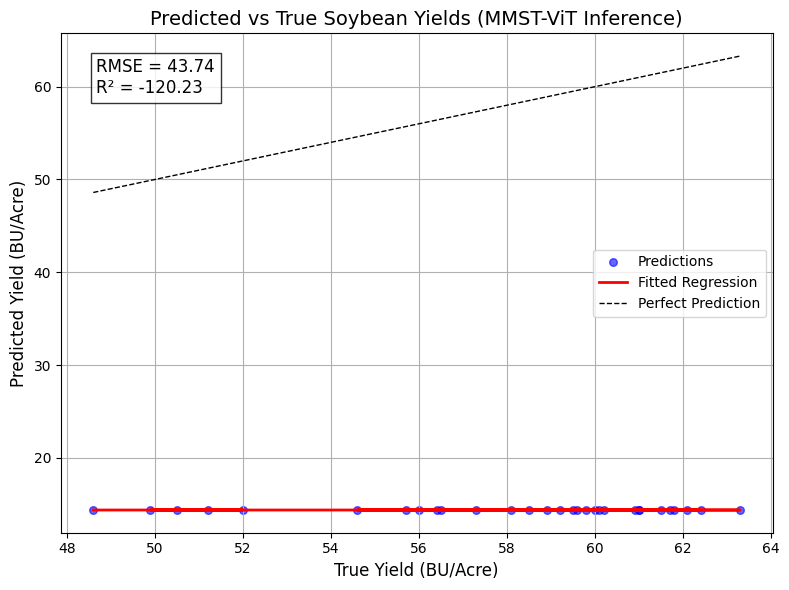

In [29]:
#plotting true vs predicted: 

#actual usda yields
y_true = np.array([
    48.6, 52.0, 50.5, 51.2, 49.9,
    58.5, 56.4, 59.2, 54.6, 56.0,
    57.3, 58.1, 59.6, 55.7, 56.5,
    61.0, 59.8, 60.2, 58.9, 60.0,
    62.1, 60.9, 61.7, 59.5, 61.0,
    63.3, 61.8, 62.4, 60.1, 61.5
])
#mmst predicted means for sentinel-2 place holder + usda and hrrr predicted values.
y_pred = np.array([
    14.387860, 14.387830, 14.387847, 14.387933, 14.388080,
    14.387880, 14.387833, 14.387881, 14.387918, 14.388056,
    14.387841, 14.387826, 14.387849, 14.387910, 14.388044,
    14.387758, 14.387792, 14.387799, 14.387937, 14.388078,
    14.387794, 14.387806, 14.387826, 14.387914, 14.388051,
    14.387843, 14.387832, 14.387851, 14.387910, 14.388042
])


#scatter plot to compare and contrast true v pred soybean yields with mmst-vit on years 2017-2021.
plt.figure(figsize=(8, 6))
plt.scatter(y_true, y_pred, color='blue', s=30, alpha=0.6, label='Predictions')

#Fitted preproccessed regression line
model = LinearRegression()
model.fit(y_true.reshape(-1,1), y_pred)
y_fit = model.predict(y_true.reshape(-1,1))
plt.plot(y_true, y_fit, color='red', linestyle='-', linewidth=2, label='Fitted Regression')
plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()],
         color='black', linestyle='--', linewidth=1, label='Perfect Prediction')

#Titles and Labels
plt.title("Predicted vs True Soybean Yields (MMST-ViT Inference)", fontsize=14)
plt.xlabel("True Yield (BU/Acre)", fontsize=12)
plt.ylabel("Predicted Yield (BU/Acre)", fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)

#place rmse, r2 in there on pred.
rmse = np.sqrt(np.mean((y_true - y_pred) ** 2))
r2 = 1 - np.sum((y_true - y_pred)**2) / np.sum((y_true - np.mean(y_true))**2)

plt.text(0.05, 0.95,
         f"RMSE = {rmse:.2f}\nR² = {r2:.2f}",
         ha="left", va="top", transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

[2.91949625e+02 2.98134145e+02 2.86667647e+02 4.16240297e+00
 7.21866687e+01 6.13618270e+00 3.50357099e+00 5.81773332e+03
 7.34587356e-01]
[2.91729655e+02 2.97967519e+02 2.86584101e+02 4.15353740e+00
 7.39361051e+01 6.20198176e+00 3.40687752e+00 5.62227103e+03
 6.97062465e-01]
[2.91707011e+02 2.97627450e+02 2.86992416e+02 1.97805508e+00
 7.58021247e+01 6.72957939e+00 3.41085362e+00 5.72466101e+03
 6.08010733e-01]
[2.91655102e+02 2.98247518e+02 2.86230962e+02 1.45344257e+00
 6.89123118e+01 7.02425761e+00 3.71638835e+00 6.27714076e+03
 8.00156691e-01]
[2.92193775e+02 2.98640906e+02 2.86599568e+02 1.86366511e+00
 6.95703923e+01 6.49663648e+00 3.53886794e+00 7.58701082e+03
 7.62984209e-01]
[2.92977823e+02 2.99574729e+02 2.86956484e+02 2.92605511e+00
 6.82770475e+01 5.95899996e+00 3.21802590e+00 5.95542363e+03
 8.97322200e-01]
[2.93114646e+02 2.99495593e+02 2.87697665e+02 3.74825618e+00
 7.14268414e+01 5.74610491e+00 2.98066145e+00 5.67527777e+03
 8.11148118e-01]
[2.92844931e+02 2.98735396e

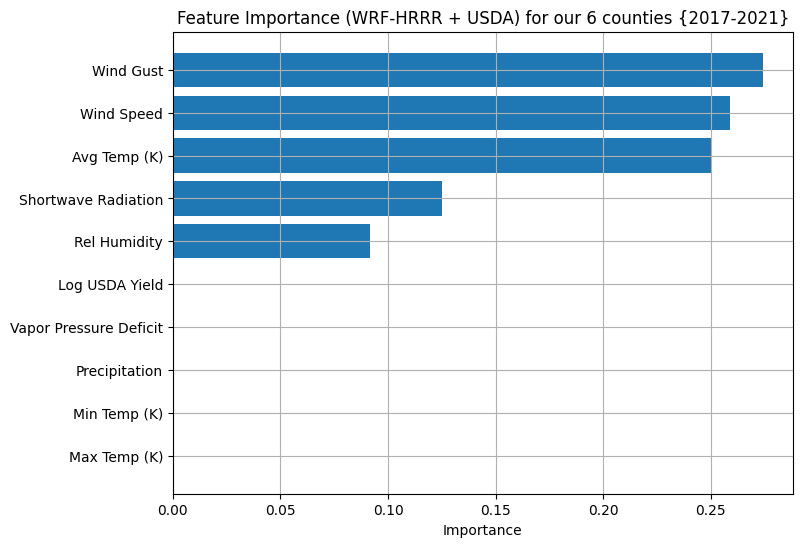

In [31]:
#Using these results to further analyze feature importance now 
#that we know that sentinel-2 imagery is crucial to predictions on these outliers for meaningful and un-flat r2 and rmse metrics
X = []  #features list
y = []  #target vals lst.

#loading in usda and hrrr data.
for sample in val_json:  
    try:
        fips = sample["FIPS"]
        year = sample["Year"]
        
        features = load_hrrr_usda_features(fips, year)  # (10,)
        X.append(features.numpy())  #convert tensor to np.array
        # True USDA yield:
        true_outlier_yields = [
                            # 19009 (Audubon County)
                            48.6, 52.0, 50.5, 51.2, 49.9,
                            
                            # 19051 (Davis County)
                            48.4, 53.5, 49.7, 50.9, 48.7,
                            
                            # 19101 (Jefferson County)
                            50.9, 55.1, 52.8, 52.1, 50.3,
                            
                            # 19141 (O'Brien County)
                            61.2, 64.3, 63.8, 64.0, 62.1,
                            
                            # 19163 (Scott County)
                            60.3, 63.7, 63.2, 63.4, 61.7,
                            
                            # 19177 (Van Buren County)
                            48.2, 52.8, 50.2, 51.7, 50.1]

        y.append(true_outlier_yields)
    except Exception as e:
        print(f"Skipping {fips} {year}: {e}")

X = np.vstack(X)  #w/ shape [N, 10]
y = np.array(y)

#Training Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)

#Evaluate Random Forest
y_pred = rf.predict(X)
mse = mean_squared_error(y, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y, y_pred)

print(f"Random Forest RMSE: {rmse:.2f}")
print(f"Random Forest R²: {r2:.2f}")

#identifying feature importances.
feature_names = [
    'Avg Temp (K)', 'Max Temp (K)', 'Min Temp (K)', 'Precipitation',
    'Rel Humidity', 'Wind Gust', 'Wind Speed', 'Shortwave Radiation', 'Vapor Pressure Deficit', 'Log USDA Yield'
]

importances = rf.feature_importances_
sorted_idx = np.argsort(importances)

plt.figure(figsize=(8,6))
plt.barh(np.array(feature_names)[sorted_idx], importances[sorted_idx])
plt.xlabel("Importance")
plt.title("Feature Importance (WRF-HRRR + USDA) for our 6 counties {2017-2021}")
plt.grid(True)
plt.show()


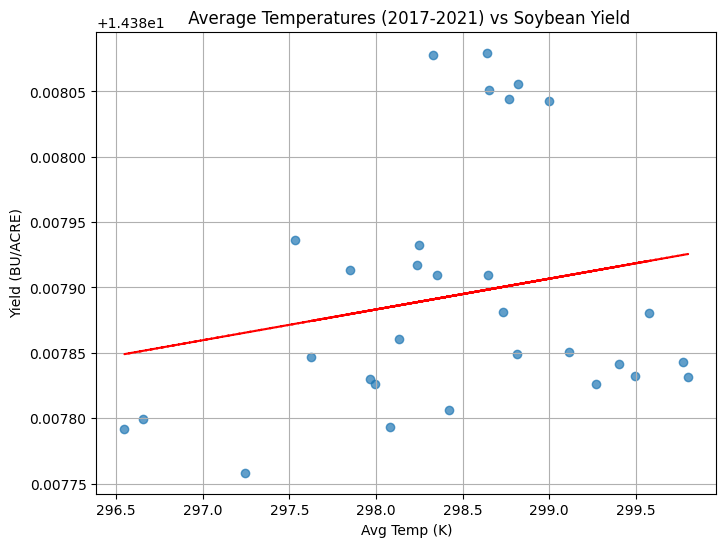

In [39]:
#Let's plot avg tem feature vs Yield as an example to see its importance and weight visually:

vpd = X[:,1]  #avg temp index
#print(vpd)
predicted_yields = np.array(inference_preds_results["Predicted_Mean"])


plt.figure(figsize=(8,6))
plt.scatter(vpd, predicted_yields, alpha=0.7)
plt.xlabel("Avg Temp (K)")
plt.ylabel("Yield (BU/ACRE)")
plt.title(" Average Temperatures (2017-2021) vs Soybean Yield")
plt.grid(True)

#Fit a regression line on our plot.
m, b = np.polyfit(vpd, predicted_yields, 1)
plt.plot(vpd, m*vpd + b, color='red', linestyle='--')

plt.show()


In [41]:
# We'll use simple z-scores for extremeness:
# Compute z-scores for the first 9 HRRR features (ignore USDA yield)
X_hrrr_only = X[:, :9]  # [N, 9]

z_scores = np.abs(zscore(X_hrrr_only, axis=0))  # [N, 9]

#Define "high-risk" counties = if any feature's z-score > threshold (e.g., 2.0)
risk_threshold = 1.49
risk_scores = (z_scores > risk_threshold).sum(axis=1)  # count how many features extreme

#create a tabular df to view risk z-scores per year per county to view the outliers.
risk_df = pd.DataFrame({
    "FIPS": [sample["FIPS"] for sample in val_json],
    "Year": [sample["Year"] for sample in val_json],
    "Risk_Score": risk_scores
})

print(risk_df.sort_values("Risk_Score", ascending=False).head(10))

     FIPS  Year  Risk_Score
17  19141  2019           6
19  19141  2021           5
18  19141  2020           5
16  19141  2018           4
15  19141  2017           3
25  19177  2017           3
2   19009  2019           2
3   19009  2020           2
26  19177  2018           2
14  19101  2021           1


In [42]:
def realload_sentinel2_data(fips, year):
    sent_root = "/Users/aubayazzarouk/Downloads/mmst_vit_proj/drive/MyDrive/MMST-ViT/TinyCropNet/Sentinel-2 Imagery/data"
    
    quarter_files = [
        os.path.join(sent_root, str(year), "IA", f"Agriculture_19_IA_{year}-04-01_{year}-06-30.h5"),
        os.path.join(sent_root, str(year), "IA", f"Agriculture_19_IA_{year}-07-01_{year}-09-30.h5"),
    ]

    all_images = []

    for qfile in quarter_files:
        if os.path.exists(qfile):
            with h5py.File(qfile, 'r') as hf:
                if fips in hf.keys():
                    group = hf[fips]
                    timestamps = sorted(list(group.keys()))
                    for ts in timestamps:
                        data = group[ts]["data"][:]  # Grab full array
                        if data.ndim == 4:
                            # Assuming (H, W, 3) for RGB is the last axis
                            all_images.append(data)  # No slicing needed
                        elif data.ndim == 3:
                            all_images.append(data)  # Already correct
                        else:
                            raise ValueError(f"Unexpected shape {data.shape} at {fips} {ts}")
                else:
                    raise ValueError(f"FIPS {fips} not found in {qfile}")
        else:
            raise FileNotFoundError(f"Sentinel-2 quarter file missing: {qfile}")
    
    if not all_images:
        raise ValueError(f"No Sentinel-2 data found for FIPS {fips}, year {year}")
    
    return np.stack(all_images)  # (T, H, W, 3)



Plotting BEST Sentinel-2 patch for FIPS 19009, Year 2017...
Best Patch at Time 11/12, Grid 2/9


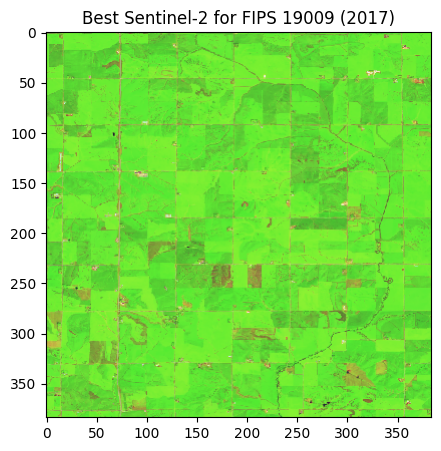


Plotting BEST Sentinel-2 patch for FIPS 19009, Year 2018...
Best Patch at Time 9/12, Grid 2/9


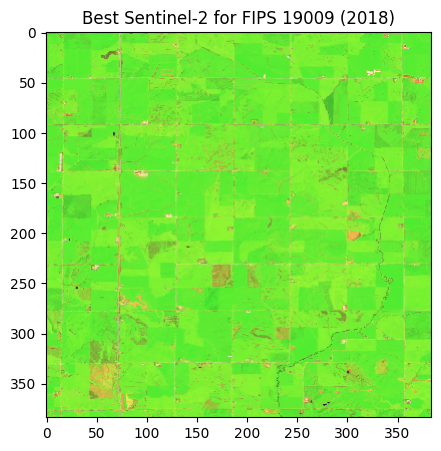


Plotting BEST Sentinel-2 patch for FIPS 19009, Year 2019...
Best Patch at Time 11/12, Grid 2/9


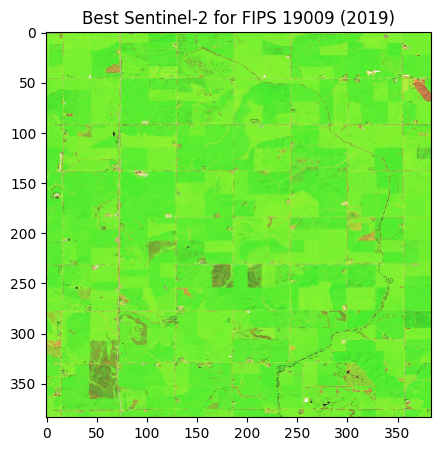


Plotting BEST Sentinel-2 patch for FIPS 19009, Year 2020...
Best Patch at Time 9/12, Grid 2/9


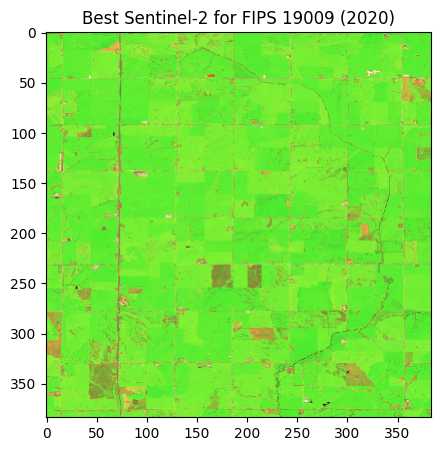


Plotting BEST Sentinel-2 patch for FIPS 19009, Year 2021...
Best Patch at Time 9/12, Grid 2/9


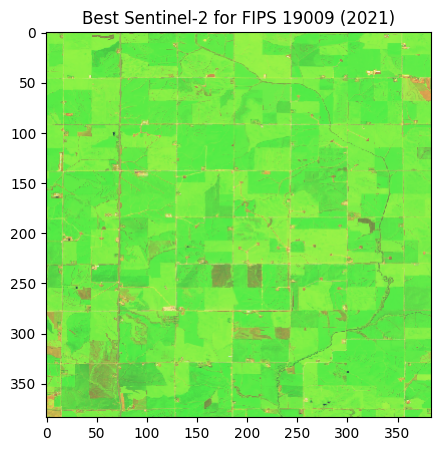


Plotting BEST Sentinel-2 patch for FIPS 19051, Year 2017...
Best Patch at Time 7/12, Grid 1/8


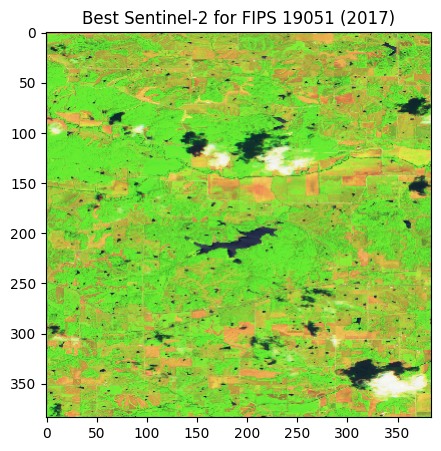


Plotting BEST Sentinel-2 patch for FIPS 19051, Year 2018...
Best Patch at Time 9/12, Grid 8/8


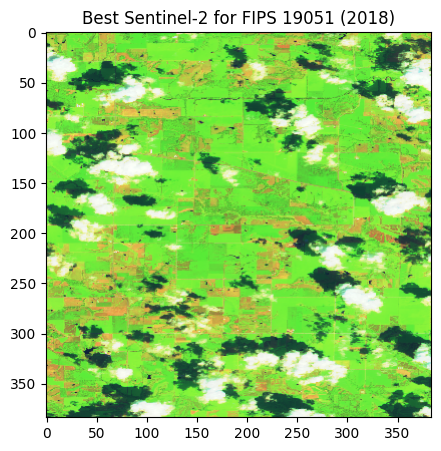


Plotting BEST Sentinel-2 patch for FIPS 19051, Year 2019...
Best Patch at Time 9/12, Grid 4/8


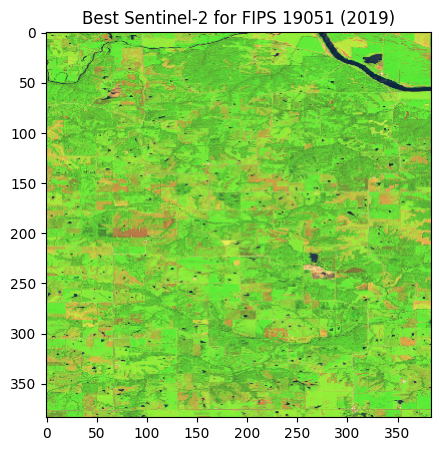


Plotting BEST Sentinel-2 patch for FIPS 19051, Year 2020...
Best Patch at Time 10/12, Grid 8/8


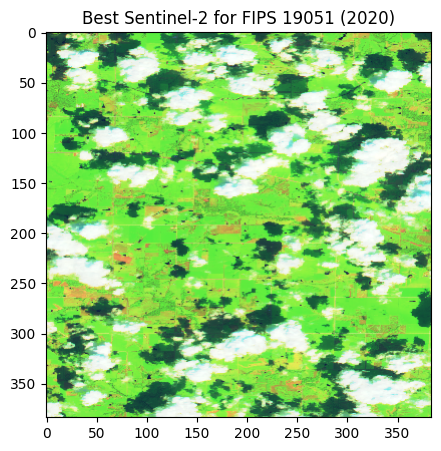


Plotting BEST Sentinel-2 patch for FIPS 19051, Year 2021...
Best Patch at Time 10/12, Grid 8/8


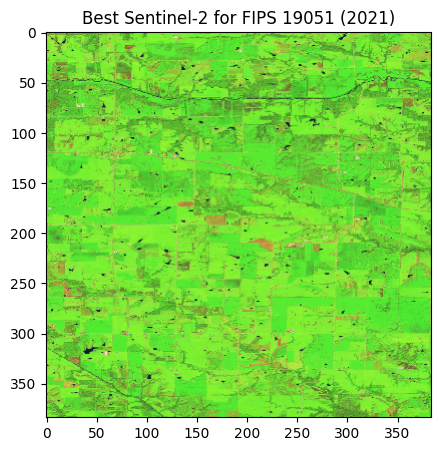


Plotting BEST Sentinel-2 patch for FIPS 19101, Year 2017...
Best Patch at Time 10/12, Grid 1/8


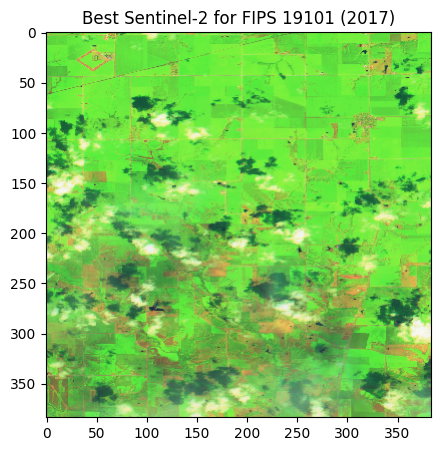


Plotting BEST Sentinel-2 patch for FIPS 19101, Year 2018...
Best Patch at Time 9/12, Grid 1/8


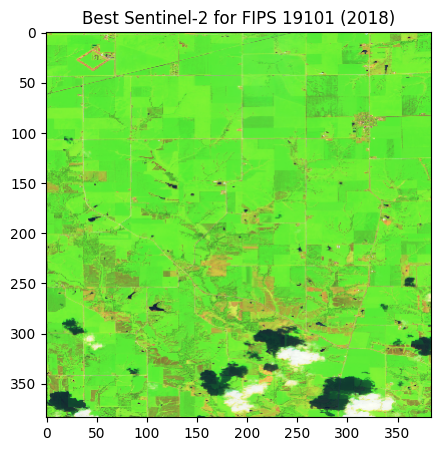


Plotting BEST Sentinel-2 patch for FIPS 19101, Year 2019...
Best Patch at Time 9/12, Grid 1/8


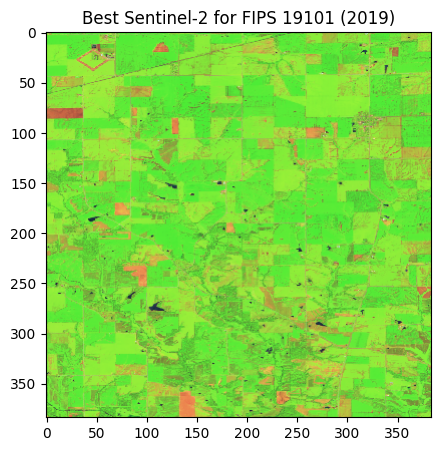


Plotting BEST Sentinel-2 patch for FIPS 19101, Year 2020...
Best Patch at Time 10/12, Grid 1/8


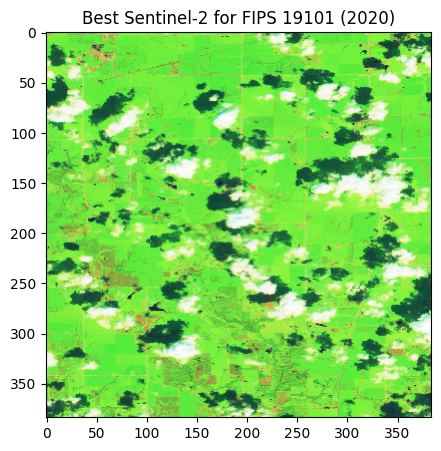


Plotting BEST Sentinel-2 patch for FIPS 19101, Year 2021...
Best Patch at Time 10/12, Grid 2/8


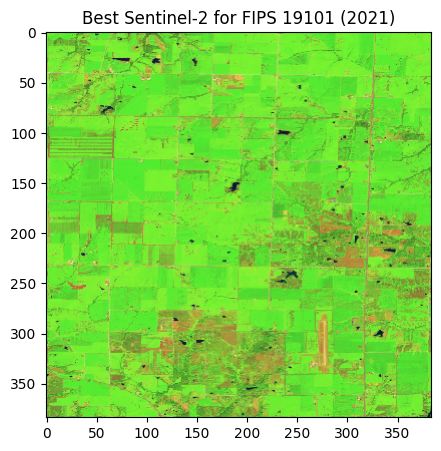


Plotting BEST Sentinel-2 patch for FIPS 19141, Year 2017...
Best Patch at Time 1/12, Grid 11/12


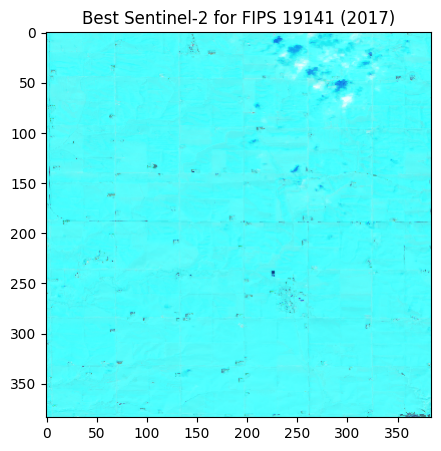


Plotting BEST Sentinel-2 patch for FIPS 19141, Year 2018...
Best Patch at Time 1/12, Grid 8/12


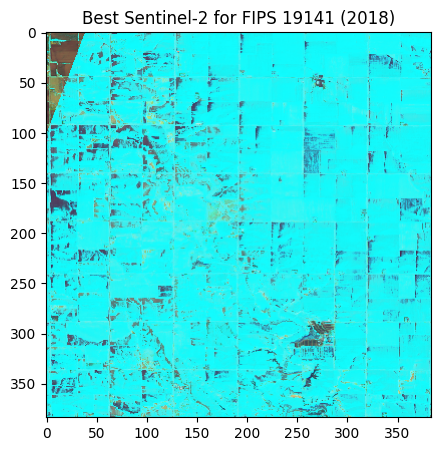


Plotting BEST Sentinel-2 patch for FIPS 19141, Year 2019...
Best Patch at Time 9/12, Grid 6/12


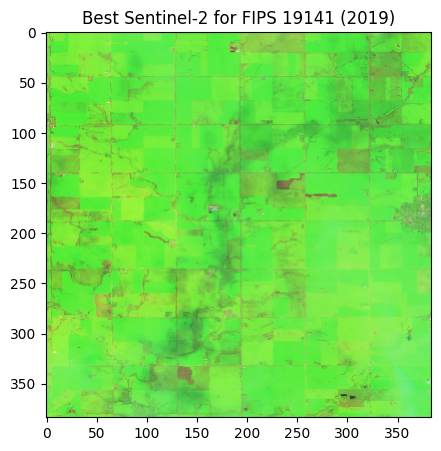


Plotting BEST Sentinel-2 patch for FIPS 19141, Year 2020...
Best Patch at Time 10/12, Grid 9/12


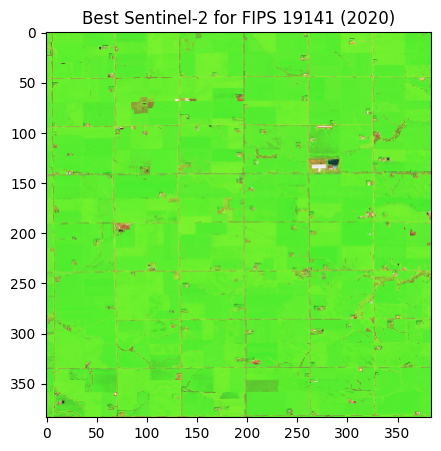


Plotting BEST Sentinel-2 patch for FIPS 19141, Year 2021...
Best Patch at Time 10/12, Grid 5/12


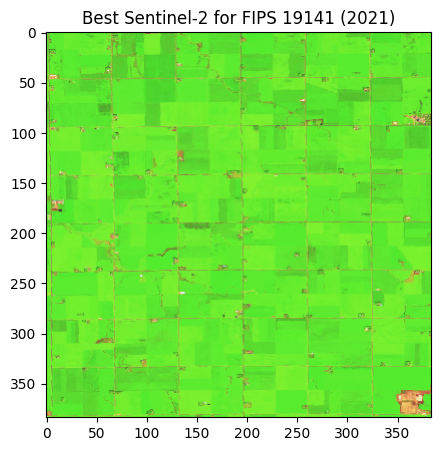


Plotting BEST Sentinel-2 patch for FIPS 19163, Year 2017...
Best Patch at Time 9/12, Grid 6/16


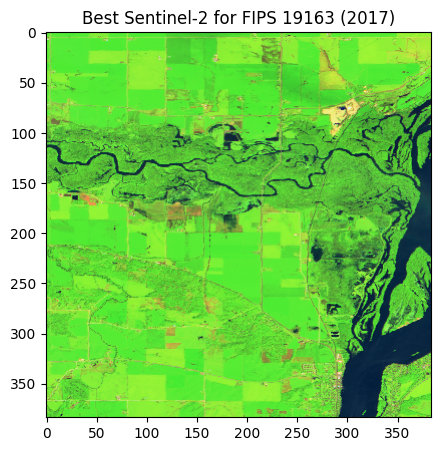


Plotting BEST Sentinel-2 patch for FIPS 19163, Year 2018...
Best Patch at Time 1/12, Grid 16/16


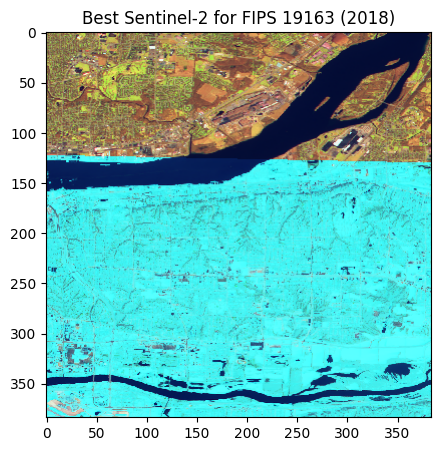


Plotting BEST Sentinel-2 patch for FIPS 19163, Year 2019...
Best Patch at Time 1/12, Grid 1/16


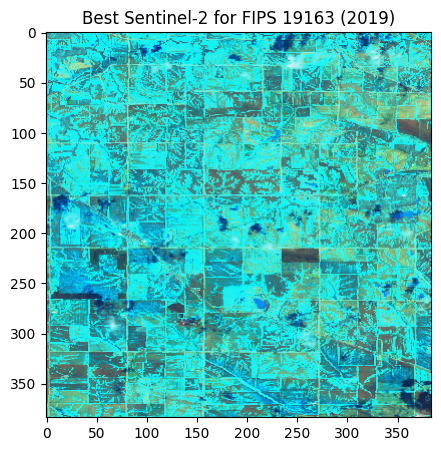


Plotting BEST Sentinel-2 patch for FIPS 19163, Year 2020...
Best Patch at Time 10/12, Grid 3/16


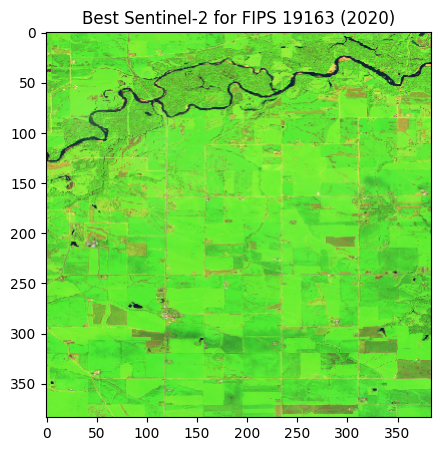


Plotting BEST Sentinel-2 patch for FIPS 19163, Year 2021...
Best Patch at Time 10/12, Grid 3/16


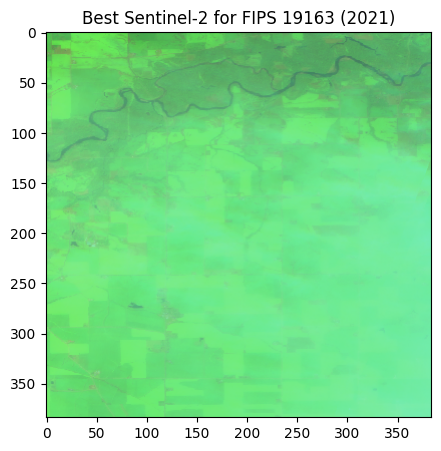


Plotting BEST Sentinel-2 patch for FIPS 19177, Year 2017...
Best Patch at Time 10/12, Grid 4/8


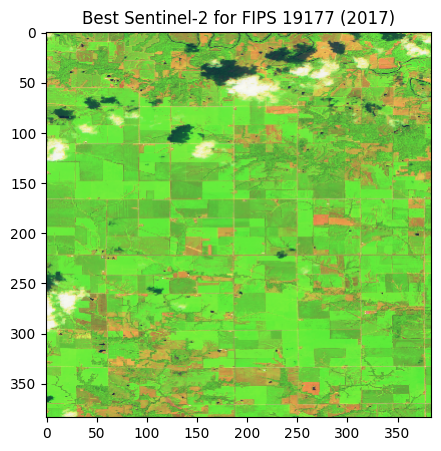


Plotting BEST Sentinel-2 patch for FIPS 19177, Year 2018...
Best Patch at Time 9/12, Grid 4/8


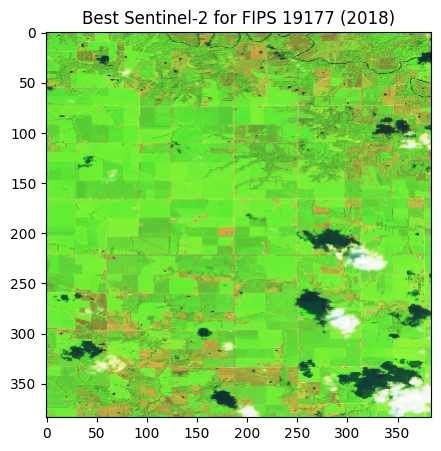


Plotting BEST Sentinel-2 patch for FIPS 19177, Year 2019...
Best Patch at Time 10/12, Grid 4/8


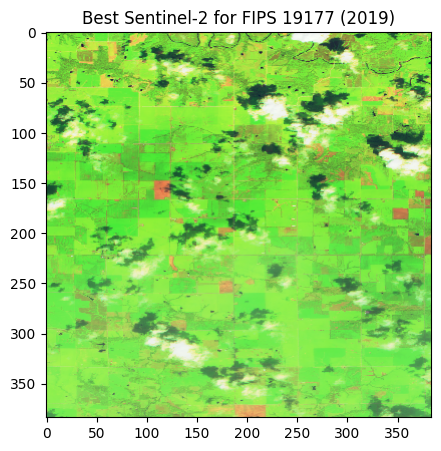


Plotting BEST Sentinel-2 patch for FIPS 19177, Year 2020...
Best Patch at Time 9/12, Grid 2/8


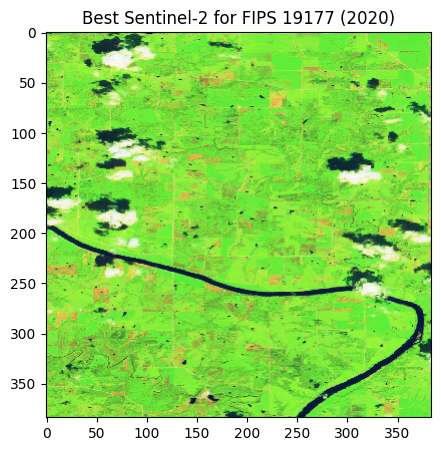


Plotting BEST Sentinel-2 patch for FIPS 19177, Year 2021...
Best Patch at Time 10/12, Grid 5/8


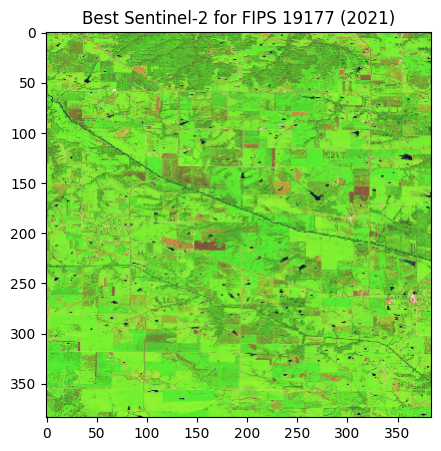

In [47]:
#modular function to find t,g patch with highest average ndvi to showcase the quality of the vegetation
#at its best time to showcase the current standings of sentinel-2 imagery in contrast to that of our predictions, inerences, and feature engineered results with wrf-hrrr and usda data on these 6 outlier counties:
    
def find_best_patch_by_ndvi(data):
    T, G, H, W, C = data.shape

    best_ndvi = -np.inf
    best_frame = None
    best_info = (None, None)

    for t in range(T):
        for g in range(G):
            img = data[t, g]  # (H,W,3)
            if img.shape[-1] != 3:
                continue

            #we can't compute true NDVI with RGB only. Let's "fake" a vegetation proxy:
            #use Green - Red proxy instead (higher green implies healthier)
            green = img[:,:,1].astype(np.float32)
            red   = img[:,:,0].astype(np.float32)

            fake_ndvi = (green - red) / (green + red + 1e-5)  # safe division

            mean_ndvi = np.nanmean(fake_ndvi)

            if mean_ndvi > best_ndvi:
                best_ndvi = mean_ndvi
                best_frame = img
                best_info = (t, g)

    return best_frame, best_info

import matplotlib.pyplot as plt

def plot_rgb_from_sentinel2(img, title="Sentinel-2 RGB Patch"):#Plot a rgb image for each patch per county to view the ndvi even though we cannot preform inference.
    #Can be conceded that this will help farmers, legislators, and agricultural producers plan ahead and at least understand the quality
    #of their surface conditions and vegetation to understand crop health and realize that their counties
    #as outliers, could very well infer that these vegetations will only worsen as time goes on in accordance
    #to wrf-hrrr and usda historical data, soybean yields, acreage, and total production:

    plt.figure(figsize=(5, 5))
    if img.max() > 1.0:
        img = img / 255.0  #normalize to rgb coloration.
    plt.imshow(img)
    plt.title(title)
    plt.show()


#Now output out the best rgb patch for each outlier by county to represent the best vegetation indices
#And note how the differences between good and bad. 
#Blue denotes : ok health
#Green denotes: good health
#red denotes: bad ndvi health
for sample in val_json:
    fips = sample["FIPS"]
    year = sample["Year"]

    try:
        print(f"\nPlotting BEST Sentinel-2 patch for FIPS {fips}, Year {year}...")

        data = realload_sentinel2_data(fips, year)  # (T,G,H,W,3)

        if data.ndim == 5:
            best_patch, (t_idx, g_idx) = find_best_patch_by_ndvi(data)
            print(f"Best Patch at Time {t_idx+1}/{data.shape[0]}, Grid {g_idx+1}/{data.shape[1]}")
        else:
            raise ValueError(f"Unexpected Sentinel-2 shape: {data.shape}")

        plot_rgb_from_sentinel2(best_patch, title=f"Best Sentinel-2 for FIPS {fips} ({year})")

    except Exception as e:
        print(f"Could not plot best patch for FIPS {fips}, Year {year}: {e}")
